In [1]:

import numpy as np
import scipy.io as sio
import os
import mat73
print(os.getcwd())
from nltk.stem import WordNetLemmatizer
#from torchtext import vocab as Vocab
import collections
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
from sklearn.decomposition import PCA
#from ..Bolu_IFG.utils import *
from tqdm import tqdm
#from tensorly.decomposition import parafac
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from utils.utils import *
from embeddings import word_embedding_in_context

d:\OneDrive - Northwestern University\PycharmProjects\Speech\IntraOp


In [2]:
data_folder='data'
patient='AZ'
all_patients=os.listdir(data_folder)
patient_folder_index=np.where([patient in s for s in all_patients])[0][0]
path=os.path.join(data_folder,all_patients[patient_folder_index],'pictureNaming_all_data.mat')

# specifically looking at precision data
#path=r'D:\OneDrive - Northwestern University\PycharmProjects\Speech\precision\data\NH_Precision\NSR-008-001A\pictureNaming_all_data.mat'
#path=os.path.join(data_folder,all_patients[patient_folder_index],'auditoryNaming_all_data.mat')
print(path)
alpha=0.05
try:
    all_data=np.array(mat73.loadmat(path)['all_data'],dtype=object)
except:
    all_data=sio.loadmat(path)['all_data']

# here we may need to take out the broken trials (edge cases)
all_data=all_data[~np.array([isinstance(a, type(None)) for a in all_data[:,0]])] # remove None trials

data\2025-11-05 AZ\pictureNaming_all_data.mat


In [3]:
pd.DataFrame(all_data) # check the number of trials for each condition

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,"[[0.8365534217797149, -0.9432519854655497, 0.1...",1.0,2.0,4.9995,None,None,milk3,None,None,True,2000.0,"[A1, A2, A3, A4, A5, A6, A7, A8, A9, A10, A11,...",nan
1,"[[-0.40253194547924, -0.5649440150580259, -0.3...",1.0,2.0,4.9995,None,None,toe3,None,None,True,2000.0,"[A1, A2, A3, A4, A5, A6, A7, A8, A9, A10, A11,...",nan
2,"[[-0.7534715697820933, -0.6427870786533235, 0....",1.0,2.000000000000001,4.9995,None,None,hand3,None,None,True,2000.0,"[A1, A2, A3, A4, A5, A6, A7, A8, A9, A10, A11,...",nan
3,"[[0.021464772295209135, -0.1490930187758218, -...",1.0,2.0,4.999499999999999,None,None,car1,None,None,True,2000.0,"[A1, A2, A3, A4, A5, A6, A7, A8, A9, A10, A11,...",nan
4,"[[0.4032771601416815, -0.31407212128120726, -0...",1.0,2.0,4.999499999999999,None,None,flower2,None,None,True,2000.0,"[A1, A2, A3, A4, A5, A6, A7, A8, A9, A10, A11,...",nan
...,...,...,...,...,...,...,...,...,...,...,...,...,...
366,"[[-0.4112481326600942, 1.036465066341494, -0.7...",1.0,2.6000000000000227,6.799499999999966,None,None,duck1,None,None,True,2000.0,"[A1, A2, A3, A4, A5, A6, A7, A8, A9, A10, A11,...",nan
367,"[[-0.35662584677928055, -0.83143160447927, 3.0...",1.0,2.6000000000000227,6.79950000000008,None,None,crab3,None,None,True,2000.0,"[A1, A2, A3, A4, A5, A6, A7, A8, A9, A10, A11,...",nan
368,"[[-0.1988276370952513, -0.41702517985413895, -...",1.0,2.6000000000000227,6.799499999999966,None,None,ladder3,None,None,True,2000.0,"[A1, A2, A3, A4, A5, A6, A7, A8, A9, A10, A11,...",nan
369,"[[0.4642796724999957, -0.9419432290436675, -0....",1.0,2.6000000000000227,6.799499999999966,None,None,bus3,None,None,True,2000.0,"[A1, A2, A3, A4, A5, A6, A7, A8, A9, A10, A11,...",nan


 | what is stored:
- HGA
- trial onset time
- green screen onset time
- trial offset time
- voice onset time
- voice offset time
- target
- answer

In [4]:
# since the picture naming has its own hand labeled category
df=pd.read_excel("../data/wordset picture naming expanded.xlsx")
word_column=df.columns[0]
df.set_index(word_column,inplace=True)
df_filled=df.fillna(0)
df_filled = df_filled.apply(pd.to_numeric)
category_series = df_filled.idxmax(axis=1).reset_index()
# Rename columns
category_series.columns = [word_column, 'Category']

# Create the mapping
word_to_category_dict = dict(zip(category_series[word_column], category_series['Category']))

In [60]:
bin_size=100 # ms

fs=int(all_data[0,10])
n_samples_per_bin=fs*bin_size//1000

# first we process the target label to remove any numbers or punctuations
target_label=reformat_raw(all_data[:,6]) # text
if 'Flashing' in path or 'auditoryNaming' in path or 'pictureNaming' in path:
    target_label=np.array([remove_number(t) for t in target_label])

# temporarily merge a few categories to balance the class
word_category=[word_to_category_dict[word[:].lower ()] for word in target_label]
word_category=[w if w!='fruit'and w!='food (exclude fruit)' else 'food and fruit' for w in word_category ]
#word_category=[w if w!='vehicle' else 'objects and tools' for w in word_category]
#word_category=['nature' if (w =='nature') | (w=='animal') |(w=='body part')|(w=='fruit') else 'man made' for w in word_category]
all_data=np.concatenate([all_data, np.array(word_category)[:,np.newaxis]], axis=1)
print(collections.Counter(word_category))

# Iteratively filter out trials of unwanted categories
#unwanted_categories = ['body part']  # List of categories to be removed
unwanted_categories=[]
category_mask=np.ones(len(word_category),dtype=bool)
category_mask=np.array([wc not in unwanted_categories for wc in word_category])
all_data=np.concatenate([all_data, category_mask[:,np.newaxis]], axis=1)
# optional: take out unwanted categories
all_data=all_data[category_mask]
word_category=[wc for wc in word_category if wc not in unwanted_categories]

# take out the data
data=all_data[:,0]
trial_onset=all_data[:,1] # in sec
green_screen_onset=all_data[:,2] # in sec
trial_offset=all_data[:,3] # in sec
voice_onset=all_data[:,4] # in sec
voice_offset=all_data[:,5] # in sec
target_label=all_data[:,6] # text
answer_label=all_data[:,7] # text
# for cat in unwanted_categories:
#     category_mask = np.array([wc != cat for wc in word_category])
    
#     # Update all clean_ variables by applying the mask
#     clean_data_binned = clean_data_binned[category_mask]
#     clean_voice_onset = clean_voice_onset[category_mask]
#     clean_voice_offset = clean_voice_offset[category_mask]
#     clean_target_label = clean_target_label[category_mask]
#     clean_answer_label = clean_answer_label[category_mask]
#     clean_green_screen_onset = clean_green_screen_onset[category_mask]
    
#     #Update word_category to exclude the unwanted category trials
#     word_category = [wc for wc in word_category if wc != cat]
    
#     # Recalculate n_clean_trials
#     n_clean_trials = clean_data_binned.shape[0]
    
#     print(f"Filtered out {cat} trials. New n_clean_trials: {n_clean_trials}")
#     print(collections.Counter(word_category))

# # Recalculate n_clean_trials
# n_clean_trials = clean_data_binned.shape[0]

# print(f"Filtered out vehicle trials. New n_clean_trials: {n_clean_trials}")
# collections.Counter(word_category)


# some manipulation of bad channels, based on which grid we are looking at.
#bad_channels=np.sort(np.int16(all_data[0,8]-1))
#bad_trials=np.sort(np.int16(all_data[0,9][0]-1))
#bad_channels=np.delete(bad_channels, np.where(bad_channels==128)) # remove channel 128+1 if it is labeles as a bad channel.

#bad_channels=bad_channels-64 # if we want the second grid
#bad_channels=bad_channels[bad_channels>=0]
bad_channels=[]
#bad_trials=[] # only for MBF picture naming task
bad_trials=all_data[:,9].astype(bool) # for LH auditory naming task
print(f'Number of bad trials: {len(np.where(bad_trials==0)[0])}')

# this is only for VB
if patient=='VB':
    bad_channels=np.arange(data[0].shape[1])
    good_ones=bad_channels[-18:-6]
    #bad_channels=good_ones
    bad_channels=np.delete(bad_channels, good_ones)


shortest_trial=min([d.shape[0] for d in data])
data=np.array([np.array([d for d in dt[:shortest_trial]]) for dt in data]).swapaxes(1,2)#[:,64:,:] # n_trial x n_channels x n_time
min_length=data.shape[2]//n_samples_per_bin *n_samples_per_bin
data=data[:,:,:min_length]
data_binned=data.reshape(data.shape[0],data.shape[1],-1,n_samples_per_bin).mean(axis=3)

n_trials=len(data)
n_channels=data.shape[1]
n_time=data.shape[2]
n_bins=data_binned.shape[2]
adjusted_fs=int(1000/bin_size)

trial_onset=reformat_raw(trial_onset)
trial_offset=reformat_raw(trial_offset)
green_screen_onset=reformat_raw(green_screen_onset)
voice_onset=reformat_raw(voice_onset)
voice_offset=reformat_raw(voice_offset)
target_label=reformat_raw(target_label)
target_label=np.array([remove_number(t) for t in target_label])
answer_label=reformat_raw(answer_label)


Counter({'objects and tools': 74, 'animal': 66, 'food and fruit': 65, 'nature': 57, 'body part': 55, 'vehicle': 54})
Number of bad trials: 0


In [31]:
# This is specifically for the precision patient
bad_channels=np.sort(np.int16(all_data[0,9]))

AxisError: axis -1 is out of bounds for array of dimension 0

In [61]:
"""
Linear Time Warping (DTW) of neural data trials
This cell performs linear time warping on each trial to normalize the duration between trial_onset and stimulus_offset.
All trials will be warped to match the median duration across trials.
"""
if 'auditoryNaming' in path:
    from scipy.interpolate import interp1d

    # Load stimulus_offset if it's auditory naming task (needed before warping)

    stimulus_offset = all_data[:, 16]  # in sec
    stimulus_offset = reformat_raw(stimulus_offset)
    stimulus_offset=np.array([s[-1] for s in stimulus_offset])

    stimulus_onset=all_data[:, 15]  # in sec
    stimulus_onset = reformat_raw(stimulus_onset)
    stimulus_onset=np.array([s[0] for s in stimulus_onset])


    # Calculate the duration from stimulus_onset_onset to stimulus_offset for each trial
    trial_durations = []
    for i in range(len(data)):
        onset_idx = int(np.round(stimulus_onset[i] * fs))
        offset_idx = int(np.round(stimulus_offset[i] * fs)) if stimulus_offset is not None else int(np.round(stimulus_offset[i] * fs))
        duration = offset_idx - onset_idx
        trial_durations.append(duration)

    trial_durations = np.array(trial_durations)
    median_duration = int(np.median(trial_durations))

    print(f"Trial durations (samples): min={trial_durations.min()}, max={trial_durations.max()}, median={median_duration}")
    print(f"Trial durations (seconds): min={trial_durations.min()/fs:.3f}, max={trial_durations.max()/fs:.3f}, median={median_duration/fs:.3f}")

    # Perform linear time warping on each trial
    data_warped = []
    stimulus_onset_warped = []
    stimulus_offset_warped = [] if 'auditoryNaming' in path else None
    trial_offset_warped = []
    green_screen_onset_warped = []
    voice_onset_warped = []
    voice_offset_warped = []

    for i in range(len(data)):
        trial = data[i]  # shape: (n_channels, n_time)
        
        # Get original timing indices
        onset_idx = int(np.round(stimulus_onset[i] * fs))
        if stimulus_offset is not None:
            offset_idx = int(np.round(stimulus_offset[i] * fs))
        else:
            offset_idx = int(np.round(trial_offset[i] * fs))
        
        # Define the pre-onset, during-trial, and post-offset segments
        pre_onset = trial[:, :onset_idx]
        during_trial = trial[:, onset_idx:offset_idx]
        post_offset = trial[:, offset_idx:]
        
        # Warp the during-trial segment to median_duration using linear interpolation
        original_time = np.arange(during_trial.shape[1])
        warped_time = np.linspace(0, during_trial.shape[1] - 1, median_duration)
        
        during_trial_warped = np.zeros((trial.shape[0], median_duration))
        for ch in range(trial.shape[0]):
            interpolator = interp1d(original_time, during_trial[ch, :], kind='linear', fill_value='extrapolate')
            during_trial_warped[ch, :] = interpolator(warped_time)
        
        # Concatenate the segments
        trial_warped = np.concatenate([pre_onset, during_trial_warped, post_offset], axis=1)
        data_warped.append(trial_warped)
        
        # Adjust timing cues
        # trial_onset remains at the same sample index
        stimulus_onset_warped.append(stimulus_onset[i])
        
        # stimulus_offset/trial_offset is now at onset_idx + median_duration
        new_offset_time = (onset_idx + median_duration) / fs
        if stimulus_offset is not None:
            stimulus_offset_warped.append(new_offset_time)
        trial_offset_warped.append(new_offset_time)
        
        # Adjust other cues proportionally within the warped segment
        # green_screen_onset, voice_onset, voice_offset
        def warp_cue(cue_time):
            cue_idx = cue_time * fs
            if cue_idx < onset_idx:
                # Before onset - no change
                return cue_time
            elif cue_idx > offset_idx:
                # After offset - shift by the difference in duration
                shift = (median_duration - (offset_idx - onset_idx)) / fs
                return cue_time + shift
            else:
                # Within the warped segment - scale proportionally
                relative_position = (cue_idx - onset_idx) / (offset_idx - onset_idx)
                new_cue_idx = onset_idx + relative_position * median_duration
                return new_cue_idx / fs
        
        green_screen_onset_warped.append(warp_cue(green_screen_onset[i]))
        voice_onset_warped.append(warp_cue(voice_onset[i]))
        voice_offset_warped.append(warp_cue(voice_offset[i]))

    # Convert to numpy arrays
    # Find the shortest warped trial to standardize lengths
    shortest_warped_trial = min([d.shape[1] for d in data_warped])
    data_warped = np.array([d[:, :shortest_warped_trial] for d in data_warped])
    stimulus_onset_warped = np.array(stimulus_onset_warped)
    stimulus_offset_warped = np.array(stimulus_offset_warped) if stimulus_offset is not None else None
    trial_offset_warped = np.array(trial_offset_warped)
    green_screen_onset_warped = np.array(green_screen_onset_warped)
    voice_onset_warped = np.array(voice_onset_warped)
    voice_offset_warped = np.array(voice_offset_warped)

    print(f"\nOriginal data shape: {data.shape}")
    print(f"Warped data shape: {data_warped.shape}")

    # Bin the warped data
    min_length_warped = data_warped.shape[2] // n_samples_per_bin * n_samples_per_bin
    data_warped = data_warped[:, :, :min_length_warped]
    data_binned_warped = data_warped.reshape(data_warped.shape[0], data_warped.shape[1], -1, n_samples_per_bin).mean(axis=3)

    print(f"Warped binned data shape: {data_binned_warped.shape}")
    print(f"Original binned data shape: {data_binned.shape}")

In [62]:
# this is only for patient LH and after
channel_names=all_data[0,11][:-1]  
#channel_names=np.concatenate([np.atleast_1d(s).astype(int) for s in channel_names])
channel_names=np.delete(channel_names,bad_channels,axis=0)
channel_colors=get_channel_colors(channel_names)

In [63]:
# here we remove the bad channels and bad trials
#clean_data_binned=np.delete(np.delete(data_binned,bad_channels,axis=1),bad_trials,axis=0)
# #clean_data_binned=(clean_data_binned-np.mean(clean_data_binned,axis=1,keepdims=True))/np.std(clean_data_binned,axis=1,keepdims=True)
# #clean_data_binned=clean_data_binned[:,:,:60]# manual inspection: there are 11 bad channels in the first grid. So 52 is the index to separate the grid
# #clean_data_binned=np.delete(clean_data_binned,[63,64,65,66,67,69,76,77,78],axis=1)

# clean_voice_onset=np.delete(voice_onset,bad_trials)
# clean_voice_offset=np.delete(voice_offset,bad_trials)
# clean_target_label=np.delete(target_label,bad_trials)
# clean_answer_label=np.delete(answer_label,bad_trials)
# clean_green_screen_onset=np.delete(green_screen_onset,bad_trials)

clean_data_binned=np.delete(data_binned,bad_channels,axis=1) # for sEEG patients there is no bad channels
clean_data_binned=clean_data_binned[bad_trials]
clean_voice_onset=voice_onset[bad_trials]
clean_voice_offset=voice_offset[bad_trials]
clean_target_label=np.squeeze(target_label[bad_trials])
clean_answer_label=answer_label[bad_trials]
clean_word_category=np.array(word_category)[bad_trials]


# nan_trials=np.where(~np.isnan(clean_voice_onset))[0]
# clean_data_binned=clean_data_binned[nan_trials]
# clean_voice_onset=clean_voice_onset[nan_trials]
# clean_voice_offset=clean_voice_offset[nan_trials]
# clean_target_label=clean_target_label[nan_trials]
# clean_answer_label=clean_answer_label[nan_trials]
# clean_green_screen_onset=green_screen_onset[nan_trials]

n_clean_channels=clean_data_binned.shape[1]
n_clean_trials=clean_data_binned.shape[0]

np.unique(target_label)

array(['airplane', 'apple', 'banana', 'bat1', 'bat2', 'beach', 'bear',
       'bed', 'bike', 'bird', 'boat', 'book', 'bus', 'car', 'cat',
       'chair', 'cherry', 'cookie', 'cow', 'crab', 'crane', 'deer', 'dog',
       'duck', 'ear', 'flower', 'fly', 'grape', 'hammer', 'hand', 'head',
       'hill', 'hurricane', 'island', 'key', 'knife', 'ladder', 'leaf',
       'leg', 'lemon', 'lock', 'lung', 'milk', 'mountain', 'mouse1',
       'mouse2', 'mouth', 'muscle', 'nail1', 'nail2', 'nose', 'nut1',
       'nut2', 'orange', 'pear', 'pizza', 'river', 'saw', 'shark', 'sky',
       'strawberry', 'subway', 'taxi', 'toe', 'train', 'tree', 'truck',
       'wrench'], dtype='<U10')

In [64]:
if 'auditoryNaming' in path:
    # Clean the warped data by removing bad channels and bad trials
    clean_data_binned_warped = np.delete(np.delete(data_binned_warped, bad_channels, axis=1), bad_trials, axis=0)
    clean_stimulus_onset_warped = np.delete(stimulus_onset_warped, bad_trials)
    clean_trial_offset_warped = np.delete(trial_offset_warped, bad_trials)
    clean_green_screen_onset_warped = np.delete(green_screen_onset_warped, bad_trials)
    clean_voice_onset_warped = np.delete(voice_onset_warped, bad_trials)
    clean_voice_offset_warped = np.delete(voice_offset_warped, bad_trials)

    if stimulus_offset_warped is not None:
        clean_stimulus_offset_warped = np.delete(stimulus_offset_warped, bad_trials)
    else:
        clean_stimulus_offset_warped = None

    print(f"Clean warped data shape: {clean_data_binned_warped.shape}")
    print(f"Clean original data shape: {clean_data_binned.shape}")

In [65]:
# very optional: select the shank of interest
#shank_of_interest=['A','B','C','D','T','U','L','W','O','J','X','Y','V','Z'] # 'anterior' or 'posterior' or 'all'
#shank_of_interest=['A','B','C','D','T','S','PC','R','L','K','J','X','Y','Z','O','AC']
shank_of_interest=['T','J','S']
clean_data_binned=clean_data_binned[:,[i for i,cn in enumerate(channel_names) if cn[0] in shank_of_interest],:]
channel_names=[cn for cn in channel_names if cn[0] in shank_of_interest]
n_clean_channels=clean_data_binned.shape[1] 
channel_colors=get_channel_colors(channel_names)

In [66]:
## This cell processes the stimulus off time and stimulus sentences for auditory naming task.
if 'auditoryNaming' in path:
    stimulus_offset=all_data[:,16] # in sec
    stimulus_offset=reformat_raw(stimulus_offset)
    stimulus_offset=np.array([s[-1] for s in stimulus_offset])


    stimulus_sentences=all_data[:,14]
    stimulus_sentences=reformat_raw(stimulus_sentences)

    back_stim_off=3
    forward_stim_off=0.5

    data_stim_off = np.array([trial[:,int(np.round(stimulus_offset[i] * fs - back_stim_off * fs)): int(np.round(stimulus_offset[i] * fs + forward_stim_off * fs))]
                               for i, trial in enumerate(data)])

    min_length_stim_off=data_stim_off.shape[2]//n_samples_per_bin *n_samples_per_bin
    data_stim_off=data_stim_off[:,:,:min_length_stim_off]
    data_binned_stim_off=data_stim_off.reshape(data_stim_off.shape[0],data_stim_off.shape[1],-1,n_samples_per_bin).mean(axis=3)
    clean_data_binned_stim_off=np.delete(data_binned_stim_off,bad_channels,axis=1)

    clean_data_binned_stim_off=np.delete(clean_data_binned_stim_off,bad_trials,axis=0)
    #clean_data_binned_stim_off=clean_data_binned_stim_off[bad_trials]
    #clean_data_binned_stim_off=clean_data_binned_stim_off[nan_trials]


    print('There are {} unique target sentences.'.format(len(set(stimulus_sentences))))
    clean_stimulus_sentences=np.delete(stimulus_sentences,bad_trials)
    clean_stimulus_offset=np.delete(stimulus_offset,bad_trials)
    #clean_stimulus_sentences=stimulus_sentences[bad_trials]
    #clean_stimulus_offset=stimulus_offset[bad_trials]
    print('There are {} unique clean target sentences.'.format(len(set(clean_stimulus_sentences))))
    #word_embedding_context=np.array([word_embedding_in_context(s, w) for s,w in zip(clean_stimulus_sentences,clean_target_label)])


Here we do one last time of filtering based on the semantic categories. We sometimes want to merge/disregard certain categories. Do it here

In [56]:
# preprocess the labels and extract the lexeme
lemmatizer = WordNetLemmatizer()
target_lexeme = np.array([lemmatizer.lemmatize(''.join([char for char in a if char.isalpha()]), pos='n') for a in clean_target_label])
answered_lexeme = [lemmatizer.lemmatize(''.join([char for char in a if char.isalpha()]), pos='n') for a in clean_answer_label]


# manually fix the "lipsmouth" and "S"
answered_lexeme=['lip' if a =='lipsmouth' else a for a in answered_lexeme]
answered_lexeme=np.array(['' if a=='S' else a for a in answered_lexeme])

n_valid_trials=np.where(answered_lexeme!='')[0].sum()

# Compute confusion matrix
cm = confusion_matrix(target_lexeme, answered_lexeme, labels=np.unique(target_lexeme))

# Create a confusion matrix display
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(target_lexeme))

# Plot the confusion matrix
fig,ax=plt.subplots(figsize=(10,10))
disp.plot(ax=ax,cmap=plt.cm.Blues,include_values=False)
plt.xticks(rotation=45)
plt.title(f'Confusion Matrix. Accuracy {np.sum(target_lexeme==answered_lexeme)/len(target_lexeme):0.2f}')
plt.show()


TypeError: 'numpy.float64' object is not iterable

C:\Users\Owner\AppData\Local\Temp\ipykernel_41948\3308076364.py:6: RuntimeWarning:

Mean of empty slice

C:\Users\Owner\AppData\Local\Temp\ipykernel_41948\3308076364.py:7: RuntimeWarning:

Mean of empty slice



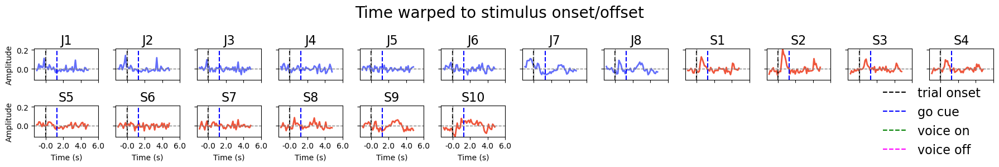

In [67]:
# plot stim on
fig,ax=plot_on_channel(clean_data_binned.mean(axis=0),
                       lines=[np.nanmean(trial_onset)-np.nanmean(trial_onset), # mean trial onset
                              #np.nanmean(stimulus_offset)-np.nanmean(trial_onset),
                              np.nanmean(green_screen_onset)-np.nanmean(trial_onset),
                              np.nanmean(clean_voice_onset)-np.nanmean(trial_onset),
                              np.nanmean(clean_voice_offset)-np.nanmean(trial_onset)],
                       line_labels=['trial onset',
                                    #'stimulus offset',
                                    'go cue',
                                    'voice on','voice off'],
                       column=12,
                       tick_interval=2,
                       back=np.nanmean(trial_onset),forward=trial_offset.mean()-np.nanmean(trial_onset),
                       suptitle=f"Time warped to stimulus onset/offset",
                       channel_colors=channel_colors,
                       title=channel_names
                       )

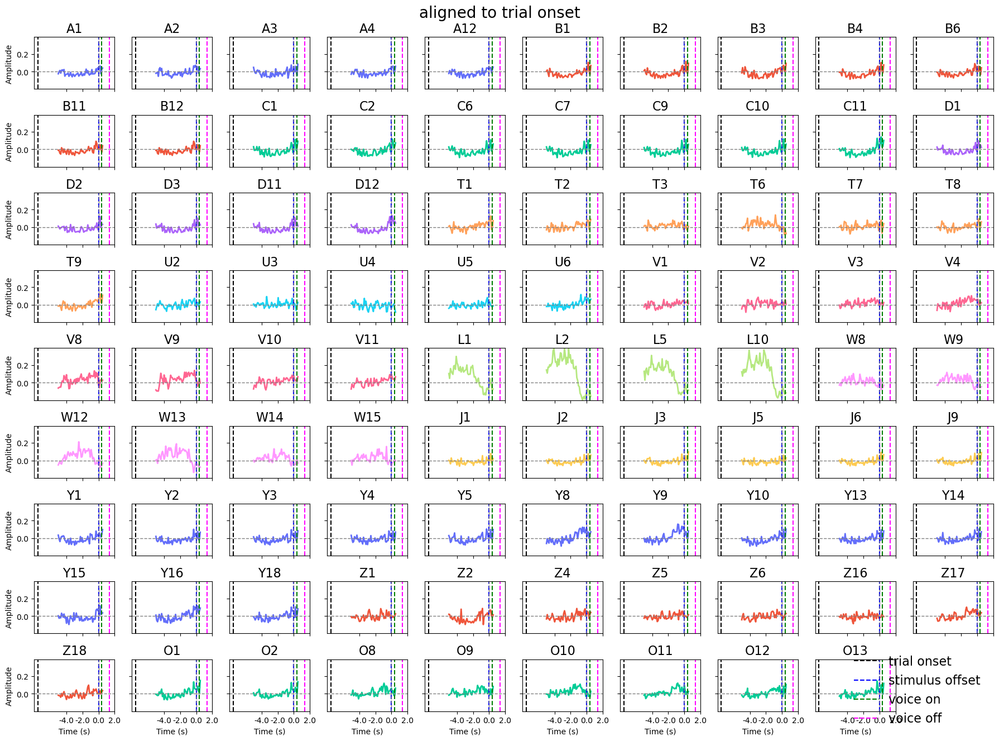

In [81]:
# plot stim off
fig,ax=plot_on_channel(clean_data_binned_stim_off.mean(axis=0),
                            lines=[
                              -np.nanmean(clean_stimulus_offset),
                              0,
                              #np.nanmean(green_screen_onset)-np.nanmean(clean_stimulus_offset),
                              np.nanmean(clean_voice_onset)-np.nanmean(clean_stimulus_offset),
                              np.nanmean(clean_voice_offset)-np.nanmean(clean_stimulus_offset)],
                       line_labels=['trial onset',
                                    'stimulus offset',
                                    #'go cue',
                                    'voice on','voice off'],
                       column=10,
                       tick_interval=2,
                       back=back_stim_off,forward=forward_stim_off,
                       suptitle=f"aligned to trial onset",
                       channel_colors=channel_colors,
                       title=channel_names
                       )

## Time warped data 

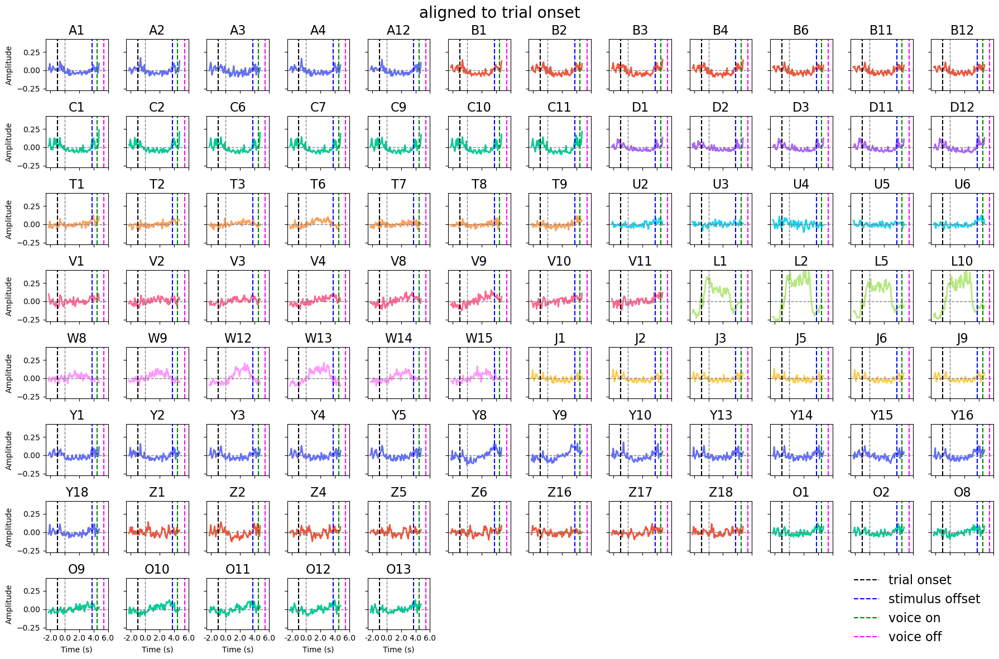

In [57]:
# plot stim on time warped
if 'auditoryNaming' in path:
    fig,ax=plot_on_channel(clean_data_binned_warped.mean(axis=0),
                        lines=[np.nanmean(stimulus_onset_warped)-np.nanmean(stimulus_onset_warped)-1, # mean trial onset
                                np.nanmean(stimulus_offset_warped)-np.nanmean(stimulus_onset_warped)-1,
                                #np.nanmean(green_screen_onset)-np.nanmean(trial_onset),
                                np.nanmean(voice_onset_warped)-np.nanmean(stimulus_onset_warped)-1,
                                np.nanmean(voice_offset_warped)-np.nanmean(stimulus_onset_warped)-1],
                        line_labels=['trial onset',
                                        'stimulus offset',
                                        #'go cue',
                                        'voice on','voice off'],
                        column=12,
                        tick_interval=2,
                        back=np.nanmean(stimulus_onset_warped),forward=trial_offset_warped.mean()-np.nanmean(stimulus_onset_warped),
                        suptitle=f"aligned to trial onset",
                        channel_colors=channel_colors,
                        title=channel_names
                        )

## Plot trial averages of PCs

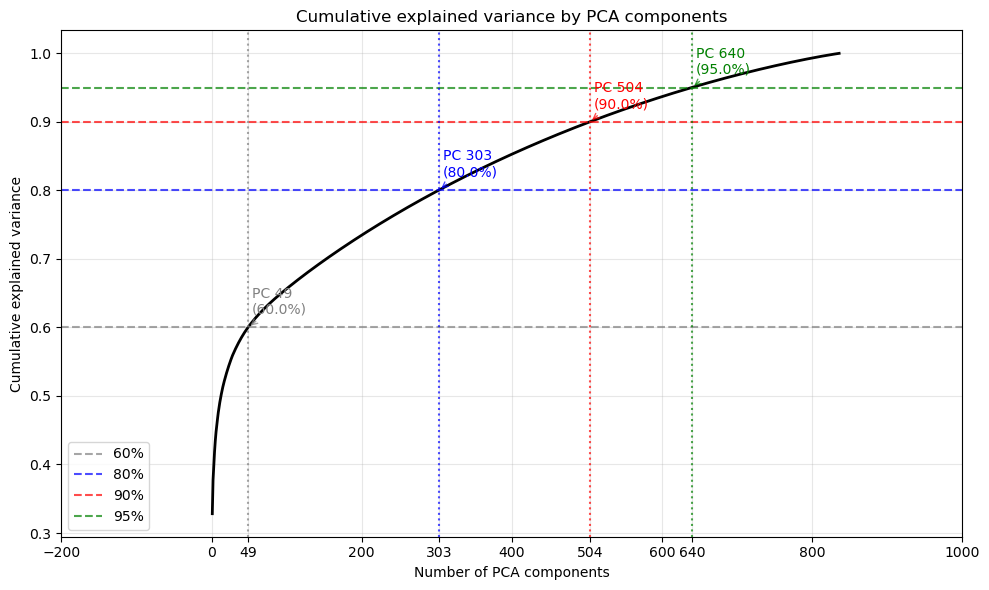

PCs needed for 60% variance: 49
PCs needed for 80% variance: 303
PCs needed for 90% variance: 504
PCs needed for 95% variance: 640


In [42]:
from sklearn.decomposition import PCA

n_PCs=100
clean_data_binned_cat=clean_data_binned.swapaxes(1,2).reshape(-1,n_clean_channels)
pca = PCA(n_components=n_clean_channels)
clean_data_binned_pca=pca.fit_transform(clean_data_binned_cat)

# Calculate cumulative explained variance
cumsum_var = np.cumsum(pca.explained_variance_ratio_)
pc_numbers = np.arange(1, n_clean_channels+1)

# Find the PC numbers where cumulative variance reaches specific thresholds
def find_pc_for_variance(cumsum_var, threshold):
    idx = np.where(cumsum_var >= threshold)[0]
    return idx[0] + 1 if len(idx) > 0 else None

pc_60= find_pc_for_variance(cumsum_var, 0.6)
pc_80 = find_pc_for_variance(cumsum_var, 0.8)
pc_90 = find_pc_for_variance(cumsum_var, 0.9)
pc_95 = find_pc_for_variance(cumsum_var, 0.95)

# Create the plot
plt.figure(figsize=(10, 6))
plt.plot(pc_numbers, cumsum_var, linewidth=2, color='black')
plt.title('Cumulative explained variance by PCA components')
plt.xlabel('Number of PCA components')
plt.ylabel('Cumulative explained variance')

# Add horizontal lines
plt.axhline(y=0.6, color='grey', linestyle='--', alpha=0.7, label='60%')
plt.axhline(y=0.8, color='b', linestyle='--', alpha=0.7, label='80%')
plt.axhline(y=0.9, color='r', linestyle='--', alpha=0.7, label='90%')
plt.axhline(y=0.95, color='g', linestyle='--', alpha=0.7, label='95%')

# Add vertical lines and annotations
colors = ['grey','b', 'r', 'g']
thresholds = [0.6,0.8, 0.9, 0.95]
pc_values = [pc_60,pc_80, pc_90, pc_95]

for i, (pc_val, threshold, color) in enumerate(zip(pc_values, thresholds, colors)):
    if pc_val is not None:
        plt.axvline(x=pc_val, color=color, linestyle=':', alpha=0.7)
        plt.annotate(f'PC {pc_val}\n({threshold*100}%)', 
                    xy=(pc_val, threshold), 
                    xytext=(pc_val + 5, threshold + 0.02),
                    arrowprops=dict(arrowstyle='->', color=color, alpha=0.7),
                    fontsize=10, ha='left', color=color)

# Set x-axis ticks to include the specific PC values
current_ticks = list(plt.xticks()[0])
new_ticks = sorted(set(current_ticks + [pc for pc in pc_values if pc is not None]))
plt.xticks(new_ticks)

plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Print the PC values for reference
print(f"PCs needed for 60% variance: {pc_60}")
print(f"PCs needed for 80% variance: {pc_80}")
print(f"PCs needed for 90% variance: {pc_90}")
print(f"PCs needed for 95% variance: {pc_95}")

In [71]:
from scipy.stats import zscore
n_PCs=50
clean_data_binned_cat=clean_data_binned.swapaxes(1,2).reshape(-1,n_clean_channels)
pca = PCA(n_components=n_PCs)
clean_data_binned_pca=pca.fit_transform(clean_data_binned_cat)
#clean_data_binned_pca=zscore(clean_data_binned_pca,axis=0)
clean_data_binned_pca=clean_data_binned_pca.reshape(n_clean_trials,-1,n_PCs).swapaxes(1,2)

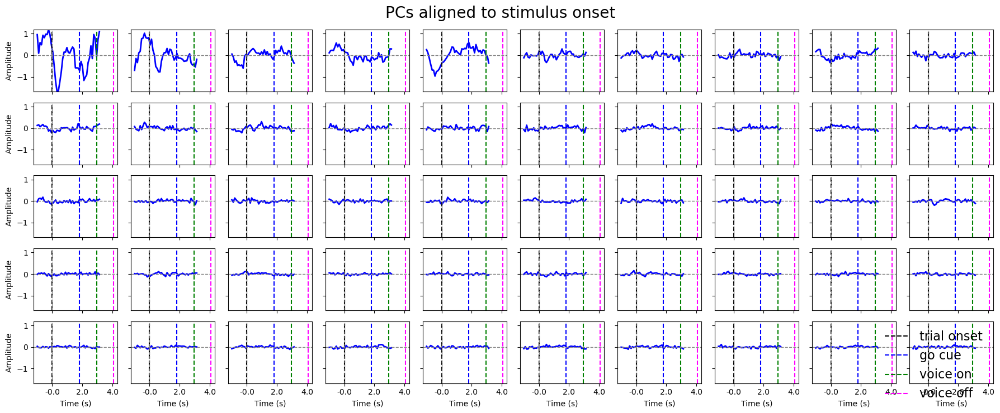

In [72]:
# plot trial averages of the PCs, aligned to stim on (trial on)

fig,ax=plot_on_channel(clean_data_binned_pca.mean(axis=0),
                       lines=[np.nanmean(trial_onset)-np.nanmean(trial_onset), # mean trial onset
                              #np.nanmean(stimulus_offset)-np.nanmean(trial_onset),
                              np.nanmean(green_screen_onset)-np.nanmean(trial_onset),
                              np.nanmean(clean_voice_onset)-np.nanmean(trial_onset),
                              np.nanmean(clean_voice_offset)-np.nanmean(trial_onset)],
                       line_labels=['trial onset',
                                    #'stimulus offset',
                                    'go cue',
                                    'voice on','voice off'],
                       column=10,
                       tick_interval=2,
                       back=np.nanmean(trial_onset),forward=trial_offset.mean()-np.nanmean(trial_onset),
                       suptitle=f"PCs aligned to stimulus onset",
                       #channel_colors=channel_colors,
                       #title=channel_names
                       )


## Plot groups of channels based on their behaviors.
- Calculate the trial averages for each channel
- Use Kmeans to cluster the trial averages
- Plot the trial averages by groups

c:\Users\Owner\miniconda3\envs\Speech\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Owner\miniconda3\envs\Speech\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(
c:\Users\Owner\miniconda3\envs\Speech\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Owner\miniconda3\envs\Speech\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to ha

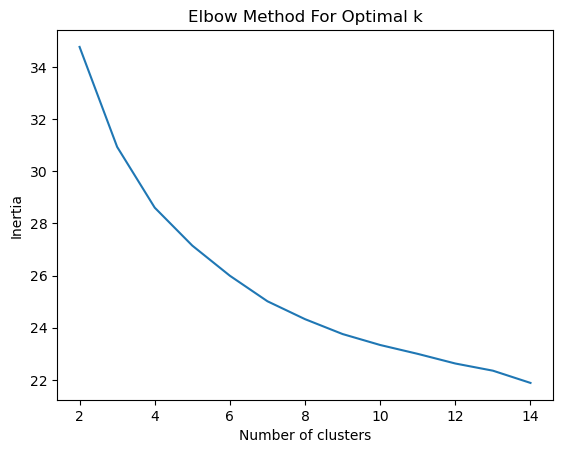

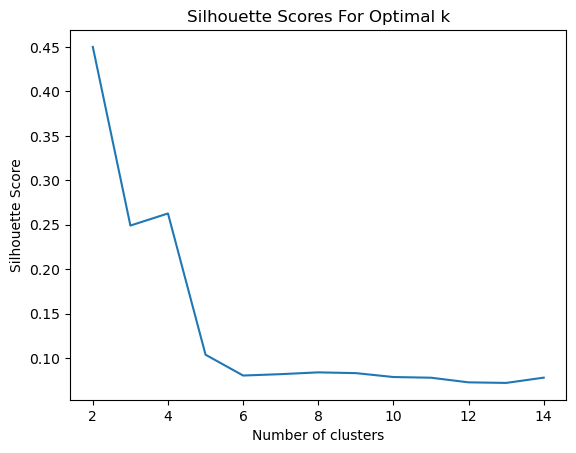

In [18]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# get the trial average across trials
clean_data_binned_trial_average=clean_data_binned.mean(axis=0)
# find the best number of clusters using elbow method
all_inertia=[]
all_silhouette=[]
for n_clusters in range(2,15):
    kmeans = KMeans(n_clusters=n_clusters, random_state=0)
    kmeans.fit(clean_data_binned_trial_average)
    inertia = kmeans.inertia_
    all_inertia.append(inertia)

    score = silhouette_score(clean_data_binned_trial_average, kmeans.labels_)
    all_silhouette.append(score)


plt.figure()
plt.plot(range(2, 15), all_inertia)
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method For Optimal k')

plt.figure()
plt.plot(range(2, 15), all_silhouette)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Scores For Optimal k')
plt.show()

c:\Users\Owner\miniconda3\envs\Speech\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Owner\miniconda3\envs\Speech\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


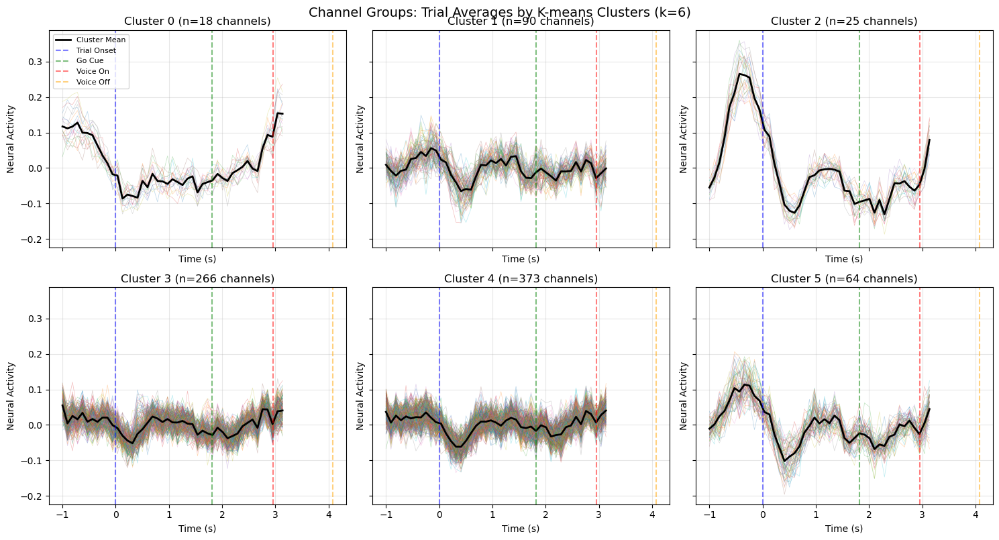


Cluster Summary:
  Cluster 0: 18 channels
  Cluster 1: 90 channels
  Cluster 2: 25 channels
  Cluster 3: 266 channels
  Cluster 4: 373 channels
  Cluster 5: 64 channels


In [22]:

kmeans = KMeans(n_clusters=6, random_state=42)
kmeans.fit(clean_data_binned_trial_average)

# Get cluster labels
labels = kmeans.labels_
n_clusters = len(np.unique(labels))

# Create time axis
n_time_bins = clean_data_binned_trial_average.shape[1]
time_axis = np.linspace(-np.nanmean(trial_onset), 
                        trial_offset.mean() - np.nanmean(trial_onset), 
                        n_time_bins)

# Create subplots - one for each cluster
n_cols = 3
n_rows = int(np.ceil(n_clusters / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 4*n_rows), sharex=True, sharey=True)
axes = axes.flatten() if n_clusters > 1 else [axes]

# Define timing markers
trial_onset_time = 0  # aligned to trial onset
go_cue_time = np.nanmean(green_screen_onset) - np.nanmean(trial_onset)
voice_on_time = np.nanmean(clean_voice_onset) - np.nanmean(trial_onset)
voice_off_time = np.nanmean(clean_voice_offset) - np.nanmean(trial_onset)

# Plot each cluster
for cluster_id in range(n_clusters):
    ax = axes[cluster_id]
    
    # Get channels in this cluster
    cluster_channels = np.where(labels == cluster_id)[0]
    
    # Plot trial average for each channel in this cluster
    for ch_idx in cluster_channels:
        ax.plot(time_axis, clean_data_binned_trial_average[ch_idx, :], 
                alpha=0.3, linewidth=0.5)
    
    # Plot cluster mean (bold)
    cluster_mean = clean_data_binned_trial_average[cluster_channels, :].mean(axis=0)
    ax.plot(time_axis, cluster_mean, 'k-', linewidth=2, label='Cluster Mean')
    
    # Add timing markers
    ax.axvline(trial_onset_time, color='blue', linestyle='--', alpha=0.5, label='Trial Onset')
    ax.axvline(go_cue_time, color='green', linestyle='--', alpha=0.5, label='Go Cue')
    ax.axvline(voice_on_time, color='red', linestyle='--', alpha=0.5, label='Voice On')
    ax.axvline(voice_off_time, color='orange', linestyle='--', alpha=0.5, label='Voice Off')
    
    ax.set_title(f'Cluster {cluster_id} (n={len(cluster_channels)} channels)')
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Neural Activity')
    ax.grid(True, alpha=0.3)
    
    if cluster_id == 0:
        ax.legend(fontsize=8, loc='best')

# Hide unused subplots
for idx in range(n_clusters, len(axes)):
    axes[idx].axis('off')

plt.tight_layout()
plt.suptitle(f'Channel Groups: Trial Averages by K-means Clusters (k={n_clusters})', 
             fontsize=14, y=1.00)
plt.show()

# Print cluster information
print(f"\nCluster Summary:")
for cluster_id in range(n_clusters):
    cluster_channels = np.where(labels == cluster_id)[0]
    print(f"  Cluster {cluster_id}: {len(cluster_channels)} channels")
    if len(cluster_channels) <= 10:
        print(f"    Channel indices: {cluster_channels}")

In [50]:
from plotly.subplots import make_subplots
from plotly.colors import qualitative as qual
from torchtext.vocab import GloVe,FastText
import pickle as pk

print(os.getcwd())
# load CLIP embeddings from folder
# embedding_folder='data/pictureNaming VB/embeddings.pk'
# with open(embedding_folder, "rb") as f:
#     results=pk.load(f)  # it has image embeddings, text embeddings and the word itself
# target_word_embed_CLIP_words=[results['text'][np.where(np.array(results['words'])==t.lower())[0]] for t in target_lexeme]
# target_word_embed_CLIP_images=[results['image'][np.where(np.array(results['words'])==t.lower())[0]] for t in target_lexeme]

# # load ViLT embeddings from folder
# embedding_folder='data/pictureNaming VB/vilt_embeddings.pk'
# with open(embedding_folder, "rb") as f:
#     results=pk.load(f)  # it has image embeddings, text embeddings and the word itself
# target_word_embed_VILT_words=[results['word_fused'][np.where(np.array(results['words'])==t.lower())[0]] for t in target_lexeme]
# target_word_embed_VILT_images=[results['cls_fused'][np.where(np.array(results['words'])==t.lower())[0]] for t in target_lexeme]

# get the static embeddings
embed=FastText(language='simple')
target_word_embed_FastText=[embed[a].numpy() for a in target_lexeme]
embed=GloVe(dim=300, name='840B')  # Load GloVe embeddings with 300 dimensions
target_word_embed_GloVe=[embed[a].numpy() for a in target_lexeme]


# Ensure arrays
target_lexeme = np.array(target_lexeme, dtype=object)
answered_lexeme = np.array(answered_lexeme, dtype=object)



# answered_word_embed=[embed[a].numpy() for a in answered_lexeme]
# target_word_embed=[embed[a].numpy() for a in target_lexeme]
# combined_fit=PCA(n_components=3)
# combined_fit.fit_transform(np.concatenate([answered_word_embed,target_word_embed]))
# answered_low_D_word_embed=combined_fit.transform(np.array(answered_word_embed))
# target_low_D_word_embed=combined_fit.transform(np.array(target_word_embed))


# Drop pairs with missing vectors
# keep = [i for i,(a,t) in enumerate(zip(answered_low_D_word_embed, target_low_D_word_embed)) if a is not None and t is not None]
# answered_low_D_word_embed = answered_low_D_word_embed[keep]
# target_low_D_word_embed = target_low_D_word_embed[keep]
# answered_word_embed = np.array([answered_word_embed[i] for i in keep])
# target_word_embed = np.array([target_word_embed[i] for i in keep])


c:\Users\Owner\miniconda3\envs\Speech\lib\site-packages\torchtext\vocab\__init__.py:4: UserWarning: 
/!\ IMPORTANT WARNING ABOUT TORCHTEXT STATUS /!\ 
Torchtext is deprecated and the last released version will be 0.18 (this one). You can silence this warning by calling the following at the beginnign of your scripts: `import torchtext; torchtext.disable_torchtext_deprecation_warning()`
  warnings.warn(torchtext._TORCHTEXT_DEPRECATION_MSG)
c:\Users\Owner\miniconda3\envs\Speech\lib\site-packages\torchtext\utils.py:4: UserWarning: 
/!\ IMPORTANT WARNING ABOUT TORCHTEXT STATUS /!\ 
Torchtext is deprecated and the last released version will be 0.18 (this one). You can silence this warning by calling the following at the beginnign of your scripts: `import torchtext; torchtext.disable_torchtext_deprecation_warning()`
  warnings.warn(torchtext._TORCHTEXT_DEPRECATION_MSG)


d:\OneDrive - Northwestern University\PycharmProjects\Speech\IntraOp


In [101]:
pca=PCA(3)
target_low_D_word_embed_FastText=pca.fit_transform(np.array(target_word_embed_FastText))
target_low_D_word_embed_GloVe=pca.fit_transform(np.array(target_word_embed_GloVe))
target_low_D_word_embed_CLIP_images=pca.fit_transform(np.array(target_word_embed_CLIP_images))
target_low_D_word_embed_CLIP_words=pca.fit_transform(np.array(target_word_embed_CLIP_words))

target_low_D_word_embed_VILT_images=pca.fit_transform(np.array(target_word_embed_VILT_images))
target_low_D_word_embed_VILT_words=pca.fit_transform(np.array(target_word_embed_VILT_words))

fig1=plot_3d_scatter(target_low_D_word_embed_GloVe,word_category,labels=target_lexeme,title='GloVe embeddings of target words')
fig2=plot_3d_scatter(target_low_D_word_embed_FastText,word_category,labels=target_lexeme,title='FastText embeddings of target words')
fig3=plot_3d_scatter(target_low_D_word_embed_CLIP_images,word_category,labels=target_lexeme,title='CLIP image embeddings of target words')
fig4=plot_3d_scatter(target_low_D_word_embed_CLIP_words,word_category,labels=target_lexeme,title='CLIP word embeddings of target words')
fig5=plot_3d_scatter(target_low_D_word_embed_VILT_images,word_category,labels=target_lexeme,title='VILT image (cls fused) embeddings of target words')
fig6=plot_3d_scatter(target_low_D_word_embed_VILT_words,word_category,labels=target_lexeme,title='VILT word (word fused) embeddings of target words')

fig1.show()
fig2.show()
fig3.show()
fig4.show()
fig5.show()
fig6.show()

NameError: name 'target_word_embed_CLIP_images' is not defined

## Doing semantic category classification

In [68]:
from sklearn.svm import LinearSVC,SVC
from models.model import BasicClassifier
from sklearn.ensemble import RandomForestClassifier as RFC
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.cross_decomposition import PLSRegression as PLS
from sklearn.neighbors import NeighborhoodComponentsAnalysis as NCA
from sklearn.neighbors import KNeighborsClassifier as KNN
from utils.utils import switch_2_number, plot_accuracy_plotly
from sklearn.manifold import TSNE
from umap import UMAP

In [22]:
# # build decoders
# n_components = 10 # number of components
# # you can also use PLSRegression, CCA, PCA, FactorAnalysis, etc.

# n_bins = 5  # number of bins
# extractor=NCA(n_components)
# decoder=SVC(kernel='rbf',class_weight='balanced')
# #extractor=None
# #decoder=MLPClassifier(hidden_layer_sizes=10,max_iter=1000,learning_rate_init=0.01,alpha=0.01,activation='relu')
# scaler=None
# bd_voice_on=BasicClassifier(extractor,decoder,scaler)
# bd_voice_on.load_data(data_binned_voice_onset.swapaxes(1,2),switch_2_number(word_category),n_bins_history=n_bins)
# bd_voice_on.fit(n_epochs=100)

In [23]:
# percentile_bybin = np.percentile(bd_voice_on.all_test_accuracy,alpha*100,axis=0)
# p_illustration=['*' if percentile_bybin[i]>np.mean(bd_voice_on.all_chance,axis=0)[i] else '' for i in range(bd_voice_on.all_chance.shape[-1])]
# fig,ax=plot_accuracy_plotly(bd_voice_on.all_test_accuracy.mean(0),bd_voice_on.all_chance.mean(0), # type: ignore
#                         lines=[0-np.nanmean(clean_voice_onset),
#                               np.nanmean(green_screen_onset)-np.nanmean(clean_voice_onset),
#                               np.nanmean(clean_voice_onset)-np.nanmean(clean_voice_onset),
#                               np.nanmean(clean_voice_offset)-np.nanmean(clean_voice_onset)],
#                        line_labels=['trial onset','go cue','voice on','voice off'],
#                         data_labels=["test accuracy","chance","train accuracy"],
#                         data_std=[bd_voice_on.all_test_accuracy.std(0),0,0], # type: ignore
#                         back=back_voice_on ,forward=forward_voice_on ,
#                         p=p_illustration,n_xticks=8,
#                         title=f"aligned to Voice onset: Decoding semantic category",)

# #fig.write_html(f"./figures/semantic_decoding/voice_onset_semantic_category_{extractor}_{decoder}_{scaler}_nbins{n_bins}_n_components{n_components}.html")
# fig.show()

In [69]:
# build decoders
n_components = 10 # number of components
# you can also use PLSRegression, CCA, PCA, FactorAnalysis, etc.

n_bins = 10 # number of bins
extractor=NCA(n_components)
#extractor=StandardScaler()
#extractor=PLS(n_components)
decoder=SVC(kernel='rbf',class_weight='balanced')
#decoder=KNN(n_jobs=-1,n_neighbors=5)
#decoder=MLPClassifier(hidden_layer_sizes=10,max_iter=10  00,learning_rate_init=0.01,alpha=0.01,activation='relu')
scaler=None
bd_trial_on=BasicClassifier(extractor,decoder,scaler)
bd_trial_on.load_data(clean_data_binned.swapaxes(1,2),switch_2_number(clean_word_category),n_bins_history=n_bins)
bd_trial_on.fit(n_epochs=50)


In [70]:
percentile_bybin = np.percentile(bd_trial_on.all_test_accuracy,alpha*100/len(bd_trial_on.all_test_accuracy[0]),axis=0)
p_illustration=['*' if percentile_bybin[i]>np.mean(bd_trial_on.all_chance,axis=0)[i] else '' for i in range(bd_trial_on.all_chance.shape[-1])]


fig,ax=plot_accuracy_plotly(
                            bd_trial_on.all_test_accuracy.mean(0), # mean test accuracy
                            bd_trial_on.all_chance.mean(0), # mean chance

                        lines=[np.nanmean(trial_onset)-np.nanmean(trial_onset), # mean trial onset
                              #np.nanmean(clean_stimulus_offset)-np.nanmean(trial_onset),
                              np.nanmean(green_screen_onset)-np.nanmean(trial_onset),
                              np.nanmean(clean_voice_onset)-np.nanmean(trial_onset),
                              np.nanmean(clean_voice_offset)-np.nanmean(trial_onset)],
                       line_labels=['trial onset',
                                    #'stimulus offset',
                                    'go cue',
                                    'voice on',
                                    'voice off'],
                        data_labels=["test accuracy","chance"],
                        data_std=[bd_trial_on.all_test_accuracy.std(0),
                                     0,
                                  ],
                        back=np.nanmean(trial_onset), forward=clean_data_binned.shape[2]/adjusted_fs-np.nanmean(trial_onset),
                        p=p_illustration,tick_interval=1,
                        title=f"Aligned to trial onset: Decoding semantic categories",)


#fig.write_html(f"./figures/semantic_decoding/trial_onset_semantic_category_{extractor}_{decoder}_{scaler}_nbins{n_bins}_n_components{n_components}.html")
fig.show()

C:\Users\Owner\AppData\Local\Temp\ipykernel_41948\4175482809.py:12: RuntimeWarning:

Mean of empty slice

C:\Users\Owner\AppData\Local\Temp\ipykernel_41948\4175482809.py:13: RuntimeWarning:

Mean of empty slice



### Decoding with time warped data

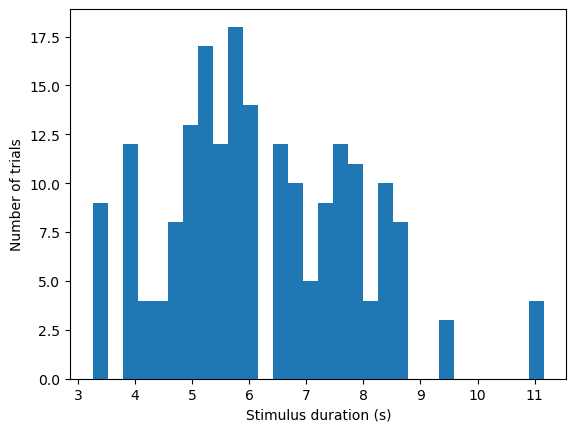

In [15]:
plt.figure()
plt.hist(stimulus_offset  -trial_onset,bins=30)
plt.xlabel('Stimulus duration (s)')
plt.ylabel('Number of trials')
plt.show()

In [29]:
# build decoders
n_components = 10 # number of components
# you can also use PLSRegression, CCA, PCA, FactorAnalysis, etc.

n_bins = 13 # number of bins
extractor=NCA(n_components)
#extractor=PLS(n_components)
decoder=SVC(kernel='rbf',class_weight='balanced')
#decoder=KNN(n_jobs=-1,n_neighbors=5)
#decoder=MLPClassifier(hidden_layer_sizes=10,max_iter=10  00,learning_rate_init=0.01,alpha=0.01,activation='relu')
scaler=None
bd_trial_on_warped=BasicClassifier(extractor,decoder,scaler)
bd_trial_on_warped.load_data(clean_data_binned_warped.swapaxes(1,2),switch_2_number(word_category),n_bins_history=n_bins)
bd_trial_on_warped.fit(n_epochs=50)

In [32]:
percentile_bybin = np.percentile(bd_trial_on_warped.all_test_accuracy,alpha*100/len(bd_trial_on_warped.all_test_accuracy[0]),axis=0)
p_illustration=['*' if percentile_bybin[i]>np.mean(bd_trial_on_warped.all_chance,axis=0)[i] else '' for i in range(bd_trial_on_warped.all_chance.shape[-1])]


fig,ax=plot_accuracy_plotly(
                            bd_trial_on_warped.all_test_accuracy.mean(0), # mean test accuracy
                            bd_trial_on_warped.all_chance.mean(0), # mean chance

                        lines=[np.nanmean(stimulus_onset_warped)-np.nanmean(stimulus_onset_warped), # mean trial onset
                              np.nanmean(stimulus_offset_warped)-np.nanmean(stimulus_onset_warped),
                              #np.nanmean(green_screen_onset)-np.nanmean(trial_onset),
                              np.nanmean(voice_onset_warped)-np.nanmean(stimulus_onset_warped),
                              np.nanmean(voice_offset_warped)-np.nanmean(stimulus_onset_warped)],
                       line_labels=['stimulus onset',
                                    'stimulus offset',
                                    #'go cue',
                                    'voice on',
                                    'voice off'],
                        data_labels=["test accuracy","chance"],
                        data_std=[bd_trial_on_warped.all_test_accuracy.std(0),
                                  0,
                                  
                                  ],
                        back=np.nanmean(stimulus_onset_warped), forward=clean_data_binned_warped.shape[2]/adjusted_fs-np.nanmean(stimulus_onset_warped),
                        p=p_illustration,tick_interval=1,
                        title=f"Warped around Stimulus: Decoding semantic categories",)


#fig.write_html(f"./figures/semantic_decoding/trial_onset_semantic_category_{extractor}_{decoder}_{scaler}_nbins{n_bins}_n_components{n_components}.html")
fig.show()

## Decoding aligned to stimulus onset

In [85]:
n_components = 10 # number of components
# you can also use PLSRegression, CCA, PCA, FactorAnalysis, etc.

n_bins = 10 # number of bins
extractor=NCA(n_components)
#extractor=PLS(n_components)
decoder=SVC(kernel='rbf',class_weight='balanced')
scaler=None

bd_stim_off=BasicClassifier(extractor,decoder,scaler)
bd_stim_off.load_data(clean_data_binned_stim_off.swapaxes(1,2),switch_2_number(word_category),n_bins_history=n_bins)
bd_stim_off.fit(n_epochs=50)

In [96]:
# Optional, plot stimulus offset aligned decoding

percentile_bybin = np.percentile(bd_stim_off.all_test_accuracy,alpha*100/len(bd_stim_off.all_test_accuracy[0]),axis=0)
p_illustration=['*' if percentile_bybin[i]>np.mean(bd_stim_off.all_chance,axis=0)[i] else '' for i in range(bd_stim_off.all_chance.shape[-1])]
fig,ax=plot_accuracy_plotly(#np.empty(len(bd_stim_off.all_test_accuracy.mean(0))),
                            bd_stim_off.all_test_accuracy.mean(0),bd_stim_off.all_chance.mean(0), # type: ignore
                        lines=[
                              -np.nanmean(clean_stimulus_offset),
                              0,
                              np.nanmean(green_screen_onset)-np.nanmean(clean_stimulus_offset),
                              np.nanmean(clean_voice_onset)-np.nanmean(clean_stimulus_offset),
                              np.nanmean(clean_voice_offset)-np.nanmean(clean_stimulus_offset)],
                       line_labels=['trial onset','stim offset','go cue','voice on','voice off'],
                        data_labels=[#"",
                                    "test accuracy","chance","train accuracy"],
                        data_std=[bd_stim_off.all_test_accuracy.std(0),
                                  #bd_trial_on.all_chance.std(0),
                                  0,
                                  0,0], # type: ignore
                        back=back_stim_off ,forward=forward_stim_off,
                        p=p_illustration,tick_interval=2,
                        title=f"Aligned to trial onset: Decoding semantic categories",)
#fig.write_html(f"./figures/semantic_decoding/trial_onset_semantic_category_{extractor}_{decoder}_{scaler}_nbins{n_bins}_n_components{n_components}.html")
fig.show()



In [ ]:
# perform feature extraction fit on individual bin
features_test=[]
features_labels=[]

for X in bd_trial_on.X_to_use:
    X_train,X_test, y_train,y_test=train_test_split(X,bd_trial_on.labels,test_size=0.3)
    extractor.fit(X_train,y_train)
    features_test.append(extractor.transform(X_test))
    features_labels.append(y_test)
    

In [ ]:
# visualization
from utils.utils import interactive_3d_scatter_plot
interactive_3d_scatter_plot(features_test, features_labels,
                            bd_trial_on.all_test_accuracy.mean(0),
                            bd_trial_on.all_chance.mean(0),
              lines=[0,
                    np.nanmean(green_screen_onset),
                    np.nanmean(clean_voice_onset),
                    np.nanmean(clean_voice_offset)],
              line_labels=['trial_onset','go cue','voice on','voice off'],
              data_labels=["test accuracy","chance","train accuracy"],
              data_std=[bd_trial_on.all_test_accuracy.std(0),0,0],
              back=0 ,forward=clean_data_binned.shape[2]/adjusted_fs,
              n_xticks=13,
              title_3D='Feature space using NCA, trained on individual time point',
              title_2D=f"aligned to Trial onset")

In [ ]:
# here we take out the ime point with the highest decoding accuracy to do the visualization
time_argmax=np.argmax(bd_trial_on.all_test_accuracy.mean(0))
extractor.fit(bd_trial_on.X_to_use[time_argmax],bd_trial_on.labels)

features=[]
features_labels=[]
for X in bd_trial_on.X_to_use:
    if X.shape[1]==bd_trial_on.X_to_use[time_argmax].shape[1]:
        features.append((extractor.transform(X)))
        features_labels.append(bd_trial_on.labels)

In [ ]:
interactive_3d_scatter_plot(features, features_labels,
                            bd_trial_on.all_test_accuracy.mean(0),
                            bd_trial_on.all_chance.mean(0),
              lines=[0,
                    np.nanmean(green_screen_onset),
                    np.nanmean(clean_voice_onset),
                    np.nanmean(clean_voice_offset)],
              line_labels=['trial_onset','go cue','voice on'
              '','voice off'],
              data_labels=["test accuracy","chance","train accuracy"],
              data_std=[bd_trial_on.all_test_accuracy.std(0),0,0],
              back=0 ,forward=clean_data_binned.shape[2]/adjusted_fs,
              p=p_illustration,n_xticks=13,
              title_3D='Feature space using NCA, trained on individual time point',
              title_2D=f"aligned to Trial onset")

# This cell plot the channel importance

In [ ]:
# Feature importance with NCA extractor
from sklearn.preprocessing import MinMaxScaler
from matplotlib import animation
all_high_D_feature_importance = []
scaled_accuracy = MinMaxScaler().fit_transform(np.mean(bd_trial_on.all_test_accuracy, axis=0)[:, None]).flatten()
for i in range(len(bd_trial_on.X_to_use)):
    this_bin = bd_trial_on.X_to_use[i]
    # extract the features
    extractor.fit(this_bin, word_category)
    X_train_low = extractor.transform(this_bin)
    # classification
    decoder.fit(X_train_low, word_category)
    feature_importance = np.mean(np.abs(decoder.coef_), axis=0)
    # project the feature importance score to the high dimensional space
    high_D_feature_importance = np.abs(extractor.components_.T @ feature_importance).reshape(-1, n_clean_channels)
    # multiply by the corresponding scaled accuracy value for this trial
    high_D_feature_importance_scaled = high_D_feature_importance * scaled_accuracy[i]
    all_high_D_feature_importance.append(high_D_feature_importance_scaled)


fig = interactive_channel_importance(
    importance_data=all_high_D_feature_importance,
    decoder_accuracy=bd_trial_on.all_test_accuracy.mean(0),
    chance_accuracy=bd_trial_on.all_chance.mean(0),
    voice_onset=clean_voice_onset.mean(0),
    voice_offset=clean_voice_offset.mean(0),
    green_screen_onset=clean_green_screen_onset.mean(0),
    trial_offset=trial_offset.mean(0),
    p_values=p_illustration,
    data_std=[bd_trial_on.all_test_accuracy.std(0), 0, 0],
    title_heatmap="Channel importance",
    title_accuracy="Decoding accuracy"
)
#animate_3d_data(all_high_D_feature_importance,"feature_importance_VB_pictureNaming.mp4")
#fig.write_html(f"./figures//trial_onset_semantic_category_channel_importance_{patient}_{extractor}_{decoder}_{scaler}_nbins{n_bins}_n_components{n_components}.html")
fig.show()

## Visualize the confusion matrix

In [71]:
true_labels_list=bd_trial_on.all_true_labels.swapaxes(0, 1).reshape(len(bd_trial_on.X_to_use), -1).astype(int)
pred_labels_list=bd_trial_on.all_predicted_labels.swapaxes(0, 1).reshape(len(bd_trial_on.X_to_use), -1).astype(int)

true_labels_list=np.array([switch_2_category(tl, word_category) for tl in true_labels_list])
pred_labels_list=np.array([switch_2_category(pl, word_category) for pl in pred_labels_list])

In [72]:
fig = interactive_confusion_accuracy(
    true_labels_list=true_labels_list,
    pred_labels_list=pred_labels_list,
    decoder_accuracy=bd_trial_on.all_test_accuracy.mean(0),
    chance_accuracy=bd_trial_on.all_chance.mean(0),
    voice_onset=clean_voice_onset.mean(0),
    voice_offset=clean_voice_offset.mean(0),
    green_screen_onset=[],
    trial_offset=trial_offset.mean(0),
    p_values=p_illustration,forward=bd_trial_on.data.shape[1]/adjusted_fs,
    title_confusion="Confusion Matrix",
    title_accuracy="Decoding Accuracy",
    normalize=None  # or 'true', 'pred', 'all' for normalized confusion matrix
)
#fig.write_html(f"./figures/trial_onset_semantic_category_confusion_{patient}_{extractor}_{decoder}_{scaler}_nbins{n_bins}_n_components{n_components}.html")
fig.update_layout(width=1500, height=750)

fig.show()

d:\OneDrive - Northwestern University\PycharmProjects\Speech\IntraOp\utils.py:953: RuntimeWarning:

Mean of empty slice

d:\OneDrive - Northwestern University\PycharmProjects\Speech\IntraOp\utils.py:954: RuntimeWarning:

Mean of empty slice



## Doing semantic (lexeme) regression using in house nonlinear method: AlignNet

In [ ]:
# # Here we are trying to do some regression task. It's shown that the dataset m
# preprocess_dim=40
# n_low_D=10
# ### preprocesing 
# preprocessor=PCA(n_components=preprocess_dim)

# # define how many bins we want in each feature
# n_bins_per_feature=10 

# # reformat the data: for each time bin we include n_bins_per_feature of history
# X=reformat(data_to_use,n_bins_per_feature) # data is a list

# #### Start decoding
# n_repeat=20
# averaged_training=[]
# averaged_score=[]
# averaged_chance=[]
# # GUI for process visualization
# #ticks = manager.counter(total=n_repeat, desc="Num. repeat", unit="repeats", color="red")

# for j in tqdm(range(n_repeat), desc='repeats', unit='rep.'):
#     score=[]
#     chance=[]
#     training_score=[]
    
#     for n_bin in range(len(X)):
#         # sample the train and test set
#         X_, X_test, y_, y_test,train_index,test_index =get_train_test_deprecated(X[n_bin],embedding_to_use,train=0.8)
        
#         # decrease the dimension
#         preprocessor.fit(X_)
#         X_low_D=preprocessor.transform(X_)
#         X_test_low_D=preprocessor.transform(X_test)
        
#         # normalize data
#         X_low_D=(X_low_D-np.mean(X_low_D,axis=1,keepdims=True))/np.std(X_low_D,axis=1,keepdims=True)
#         X_test_low_D=(X_test_low_D-np.mean(X_test_low_D,axis=1,keepdims=True))/np.std(X_test_low_D,axis=1,keepdims=True)
        
#         # split the train and val set
#         X_train_low_D, X_val_low_D, y_train_new, y_val,_,_ =get_train_test_deprecated(X_low_D,y_,train=0.8)

#         # do the regression(alignment)  
        
#         extractor=AlignmentNet(n_features=X_train_low_D.shape[1],
#                                n_targets=y_train_new.shape[1],n_low_D=n_low_D)  
    
#         # do the regression(alignment)  
#         extractor.fit(X_train_low_D,y_train_new,X_val_low_D,y_val,learning_rate=0.02,lambda_l1=0.005, num_iterations=200,fix_y=False)
#         tr_sc=extractor.score(X_train_low_D,y_train_new)
#         sc=extractor.score(X_test_low_D,y_test)
        
#         extractor=AlignmentNet(n_features=X_low_D.shape[1],n_targets=y_train_new.shape[1],n_low_D=n_low_D)  
#         np.random.shuffle(X_train_low_D.T)
#         np.random.shuffle(X_val_low_D.T)
#         extractor.fit(X_train_low_D,y_train_new,X_val_low_D,y_val,learning_rate=0.02,lambda_l1=0.005,num_iterations=200)
#         ch=extractor.score(X_test_low_D,y_test)
        
#         score.append(sc) 
#         chance.append(ch)
#         training_score.append(tr_sc)
#     averaged_score.append(score)
#     averaged_chance.append(chance)
#     averaged_training.append(training_score)
     

In [ ]:
# alpha = 1
# #percentile_bybin = np.percentile(averaged_accuracy,alpha,axis=0)
# #p_illustration=['*' if 0.05<percentile_bybin[i] else '' for i in range(n_bins)]
# 
# # percentile_bybin = np.percentile(averaged_score,alpha,axis=0)
# # p_illustration=['*' if percentile_bybin[i]>0 else '' for i in range(n_bins)]
# 
# percentile_bybin = np.percentile(averaged_score,100-alpha,axis=0)
# p_illustration=['*' if percentile_bybin[i]<np.mean(averaged_chance,axis=0)[i]-0.08 else '' for i in range(n_bins)]

In [ ]:
# fig,ax=plt.subplots(1,1,figsize=(10,5))
# ax.plot(np.linspace(-back,forward,n_bins),np.mean(averaged_training,axis=0),lw=3,color='m',alpha=0.2)
# ax.plot(np.linspace(-back,forward,n_bins),np.mean(averaged_score,axis=0),lw=3)
# ax.plot(np.linspace(-back,forward,n_bins),np.mean(averaged_chance,axis=0)-0.08,lw=2,linestyle='--',color='orange')
# ax.fill_between(np.linspace(-back,forward,n_bins),
#                 np.mean(averaged_score,axis=0)-np.std(averaged_score,axis=0),
#                np.mean(averaged_score,axis=0)+np.std(averaged_score,axis=0),alpha=0.2)
# ax.axvspan(np.nanmean(clean_voice_offset-clean_trial_onset) - np.nanstd(clean_voice_offset-clean_trial_onset), np.nanmean(clean_voice_offset-clean_trial_onset) + np.nanstd(clean_voice_offset-clean_trial_onset), color='c', alpha=0.2)
# ax.axvline(0, color='m', linestyle='--', linewidth=2)
# ax.axvline(np.nanmean(clean_voice_offset-clean_trial_onset), color='c', linestyle='--', linewidth=2)
# ax.set_xticks(np.linspace(-back,forward,5), [f"{i:0.1f}" for i in np.linspace(-back,forward,5)])
# #ax.set_ylim([-2,1])
# ax.set_xlabel("time (s)")
# ax.set_ylabel("L2 distance")
# for label, loc in zip(p_illustration,np.linspace(0,(back*adjusted_fs+forward*adjusted_fs),n_bins)):
#     ax.text(loc, 0.75, label, ha='center', va='center')
# 
# plt.show()

# Doing Kernel ridge regression from Neural activity to word embeddings

In [99]:
from models.model import BasicRegressor
from sklearn.linear_model import Ridge
from sklearn.cross_decomposition import PLSRegression,CCA
from sklearn.kernel_ridge import KernelRidge

In [109]:
y_reducer=PCA(10)
#regressor=PLSRegression(n_components=3)
regressor=KernelRidge(alpha=1.2,kernel='rbf')
#regressor=Ridge(alpha=0)
#regressor=CCA(n_components=3)
br_GloVe=BasicRegressor(regressor,y_reducer=y_reducer)
br_GloVe.load_data(clean_data_binned.swapaxes(1,2),target_word_embed_GloVe,n_bins_history=10)
br_GloVe.fit(n_epochs=50)


# br_FastText=BasicRegressor(regressor,y_reducer=y_reducer)
# br_FastText.load_data(clean_data_binned.swapaxes(1,2),target_word_embed_FastText,n_bins_history=5)
# br_FastText.fit(n_epochs=20)

# br_BERT=BasicRegressor(regressor,y_reducer=y_reducer)
# br_BERT.load_data(clean_data_binned.swapaxes(1,2),word_embedding_context,n_bins_history=8)
# br_BERT.fit(n_epochs=50)


# br_CLIP_images=BasicRegressor(regressor,y_reducer=y_reducer)
# br_CLIP_images.load_data(clean_data_binned.swapaxes(1,2),target_word_embed_CLIP_images,n_bins_history=5)
# br_CLIP_images.fit(n_epochs=20)


# br_CLIP_words=BasicRegressor(regressor,y_reducer=y_reducer)
# br_CLIP_words.load_data(clean_data_binned.swapaxes(1,2),target_word_embed_CLIP_words,n_bins_history=5)
# br_CLIP_words.fit(n_epochs=20)

# br_VILT_images=BasicRegressor(regressor,y_reducer=y_reducer)
# br_VILT_images.load_data(clean_data_binned.swapaxes(1,2),target_word_embed_VILT_images,n_bins_history=5)
# br_VILT_images.fit(n_epochs=20)


# br_VILT_words=BasicRegressor(regressor,y_reducer=y_reducer)
# br_VILT_words.load_data(clean_data_binned.swapaxes(1,2),target_word_embed_VILT_words,n_bins_history=5)
# br_VILT_words.fit(n_epochs=20)


In [110]:
percentile_bybin = np.percentile(br_GloVe.all_test_score,alpha*100,axis=0)
p_illustration=['*' if percentile_bybin[i]>np.mean(br_GloVe.all_chance,axis=0)[i] else '' for i in range(br_GloVe.all_chance.shape[-1])]
fig,ax=plot_accuracy_plotly(br_GloVe.all_test_score.mean(0),
                            br_GloVe.all_chance.mean(0),
                            #br_BERT.all_test_score.mean(0), 
                            # br_CLIP_images.all_test_score.mean(0),
                            # br_CLIP_words.all_test_score.mean(0),
                            # br_VILT_images.all_test_score.mean(0),
                            # br_VILT_words.all_test_score.mean(0),
                        lines=[0-np.nanmean(trial_onset),
                              np.nanmean(clean_stimulus_offset)-np.nanmean(trial_onset),
                              #np.nanmean(green_screen_onset)-np.nanmean(trial_onset),
                              np.nanmean(clean_voice_onset)-np.nanmean(trial_onset),
                              np.nanmean(clean_voice_offset)-np.nanmean(trial_onset)],
                       line_labels=['trial onset',
                                   'stim offset',
                                   #'go cue',
                                   'voice on','voice off'],
                        data_labels=["GloVe","chance"#,"BERT",
                                    #  "CLIP images","CLIP words",
                                     #"VILT images","VILT words"
                                     ],
                        data_std=[br_GloVe.all_test_score.std(0),
                                   0,
                                   #br_BERT.all_test_score.std(0),
                                   #br_CLIP_images.all_test_score.std(0),
                                   #br_CLIP_words.all_test_score.std(0)
                                   ], # type: ignore
                        back=np.nanmean(trial_onset), forward=clean_data_binned.shape[2]/adjusted_fs-np.nanmean(trial_onset),
                        p=p_illustration,
                        ylabel='1-SSE/SST (R2)',
                        tick_interval=1,
                        title=f"aligned to Trial onset: regression to embeddings",)

fig.show()

## Optional, align data to stimulus offset

In [111]:
y_reducer=PCA(8)
regressor=KernelRidge(alpha=2,kernel='rbf')

br_GloVe_stim_off=BasicRegressor(regressor,y_reducer=y_reducer)
br_GloVe_stim_off.load_data(clean_data_binned_stim_off.swapaxes(1,2),target_word_embed_GloVe,n_bins_history=8)
br_GloVe_stim_off.fit(n_epochs=50)


# br_BERT_stim_off=BasicRegressor(regressor,y_reducer=y_reducer)
# br_BERT_stim_off.load_data(clean_data_binned_stim_off.swapaxes(1,2),word_embedding_context,n_bins_history=8)
# br_BERT_stim_off.fit(n_epochs=50)

In [115]:
#percentile_bybin = np.percentile(br_trial_on.all_test_score,alpha*100,axis=0)
#p_illustration=['*' if percentile_bybin[i]>np.mean(br_trial_on.all_chance,axis=0)[i] else '' for i in range(br_trial_on.all_chance.shape[-1])]
fig,ax=plot_accuracy_plotly(br_GloVe_stim_off.all_test_score.mean(0),
                            br_GloVe_stim_off.all_chance.mean(0),
                            #br_BERT_stim_off.all_test_score.mean(0),

                        lines=[
                               -np.nanmean(clean_stimulus_offset),
                               0,
                              np.nanmean(green_screen_onset)-np.nanmean(clean_stimulus_offset),
                              np.nanmean(clean_voice_onset)-np.nanmean(clean_stimulus_offset),
                              np.nanmean(clean_voice_offset)-np.nanmean(clean_stimulus_offset)],
                       line_labels=['trial onset',
                                   'stim offset',
                                   'go cue','voice on','voice off'],
                        data_labels=["GloVe","chance","BERT",
             
                                     ],
                        data_std=[br_GloVe_stim_off.all_test_score.std(0),
                                   #0,
                                   0], # type: ignore
                        back=back_stim_off ,forward=forward_stim_off,
                        ylabel='1-SSE/SST (R2)',
                        tick_interval=2 ,
                        title=f"aligned to Stimulus offset: regression to embeddings",)
 
fig.show()

# Here we use the pre-train decoder on the Bulgarian dataset

In [ ]:
# train a decoder at the time point where it has the highest decodeing accuracy
# This requires bd_trial_on to be trained first to identify the best time point
from sklearn.base import clone
best_extractor=clone(extractor)
best_decoder=clone(decoder)

time_argmax=np.argmax(bd_trial_on.all_test_accuracy.mean(0))\
best_decoder.fit(best_extractor.fit_transform(bd_trial_on.X_to_use[time_argmax],bd_trial_on.labels),bd_trial_on.labels)


In [18]:
# Load the Bulgarian dataset
path=os.path.join(data_folder,all_patients[patient_folder_index],'pictureNamingBulgarian_all_data.mat')
all_data_bul=sio.loadmat(path)['all_data']
data_bul=all_data_bul[:,0]
data_bul=np.array([np.array([d for d in dt]) for dt in data_bul]).swapaxes(1,2)#[:,64:,:] # n_trial x n_channels x n_time
min_length=data_bul.shape[2]//n_samples_per_bin *n_samples_per_bin
data_bul=data_bul[:,:,:min_length]
data_binned_bul=data_bul.reshape(data_bul.shape[0],data_bul.shape[1],-1,n_samples_per_bin).mean(axis=3)
bad_trials_bul=[]
clean_data_binned_bul=np.delete(np.delete(data_binned_bul,bad_channels,axis=1),bad_trials_bul,axis=0)

green_screen_onset_bul=all_data_bul[:,2] # in sec
green_screen_onset_bul=np.array([gso[0][0] for gso in green_screen_onset_bul])

target_label_bul=all_data_bul[:,6]
target_label_bul=np.array([tl[0][0] for tl in target_label_bul],dtype=object)

clean_target_label_bul=np.delete(target_label_bul,bad_trials_bul)
word_category_bul=[word_to_category_dict[word[:].lower()] for word in clean_target_label_bul]

In [21]:
print(f"Filtered out vehicle trials. New n_clean_trials: {clean_target_label_bul.shape[0]}")
collections.Counter(word_category_bul)

Filtered out vehicle trials. New n_clean_trials: 92


Counter({'abstract': 20,
         'objects and tools': 16,
         'animal': 14,
         'nature': 14,
         'fruit': 14,
         'body part': 12,
         'vehicle': 2})

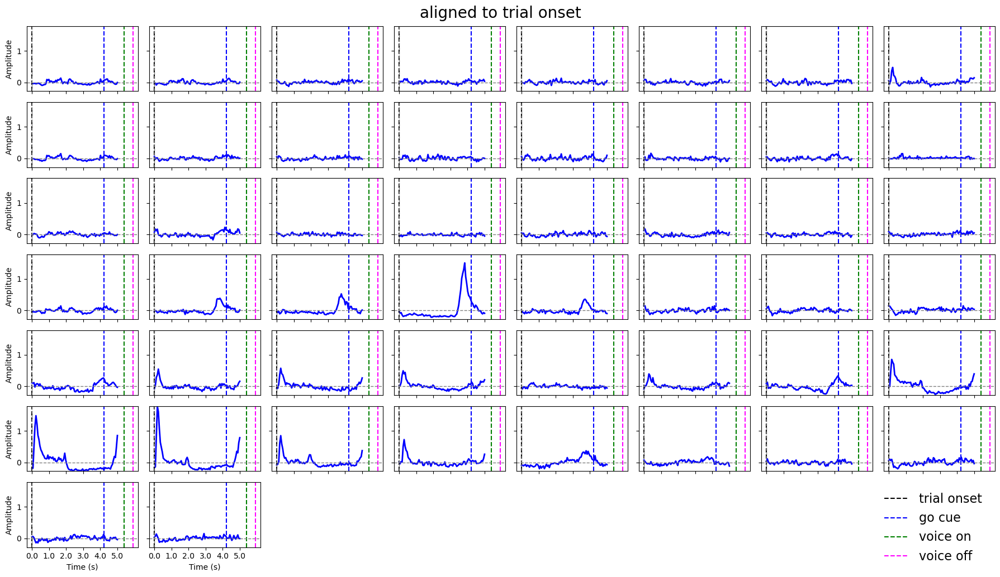

In [20]:
fig,ax=plot_on_channel(clean_data_binned_bul.mean(axis=0),
                       lines=[0,
                              np.nanmean(green_screen_onset),
                              np.nanmean(clean_voice_onset),
                              np.nanmean(clean_voice_offset)],
                       line_labels=['trial onset','go cue','voice on','voice off'],
                       column=8,
                       back=0,forward=clean_data_binned_bul.shape[1]/adjusted_fs,
                       suptitle=f"aligned to trial onset")

In [ ]:
bd_bul=BasicClassifier(best_extractor,best_decoder,scaler=None)
bd_bul.load_data(clean_data_binned_bul[:46,:,:53].swapaxes(1,2),switch_2_number(word_category_bul[:46]),n_bins_history=5)


all_test_accuracies_bul1=[]
for i in range(len(bd_bul.X_to_use)):
    if i>=n_bins:
        test=bd_bul.predict(bd_bul.X_to_use[i])
        test_accuracy=np.sum(test==bd_bul.labels)/len(test)

        all_test_accuracies_bul1.append(test_accuracy)

bd_bul.load_data(clean_data_binned_bul[46:,:,:53].swapaxes(1,2),switch_2_number(word_category_bul[46:]),n_bins_history=5)
all_test_accuracies_bul2=[]
for i in range(len(bd_bul.X_to_use)):
    if i>=n_bins:
        test=bd_bul.predict(bd_bul.X_to_use[i])
        test_accuracy=np.sum(test==bd_bul.labels)/len(test)

        all_test_accuracies_bul2.append(test_accuracy)

bd_bul.load_data(clean_data_binned[:,:,:53].swapaxes(1,2),switch_2_number(word_category),n_bins_history=5)
all_test_accuracies_eng=[]
for i in range(len(bd_bul.X_to_use)):
    if i>=n_bins:
        test=bd_bul.predict(bd_bul.X_to_use[i])
        test_accuracy=np.sum(test==bd_bul.labels)/len(test)

        all_test_accuracies_eng.append(test_accuracy)


In [ ]:
#p_illustration=['*' if percentile_bybin[i]>np.mean(bd_trial_on.all_chance,axis=0)[i] else '' for i in range(bd_trial_on.all_chance.shape[-1])]
fig,ax=plot_accuracy_plotly(np.array(all_test_accuracies_bul1), # type: ignore
                             np.array(all_test_accuracies_bul2),
                             np.array(all_test_accuracies_eng),
                        lines=[0,
                              np.nanmean(green_screen_onset),
                              np.nanmean(clean_voice_onset),
                              np.nanmean(clean_voice_offset)],
                       line_labels=['trial onset','go cue','voice on','voice off'],
                        data_labels=["Bulgarian 1","Bulgarian 2","English"],
                        data_std=[0,0,0], # type: ignore
                        back=-n_bins/adjusted_fs ,forward=clean_data_binned_bul.shape[1]/adjusted_fs,
                        p=p_illustration[5:],n_xticks=6,
                        title=f"aligned to Trial onset: Decoding semantic category",)
#fig.write_html(f"./figures/semantic_decoding/trial_onset_semantic_category_{extractor}_{decoder}_{scaler}_nbins{n_bins}_n_components{n_components}.html")
fig.show()

# Use pictureNaming_Eng regression on the word reading task to see if there is lexical information. (And the reverse)

In [ ]:
# Load the word reading aloud dataset
path=os.path.join(data_folder,all_patients[patient_folder_index],'Day3_readingWords_aloud_exp1_all_data.mat')
all_data_wr=sio.loadmat(path)['all_data']

path=os.path.join(data_folder,all_patients[patient_folder_index],'Day3_readingWords_aloud_exp1_withemg_all_data.mat')
all_data_wr=np.concatenate([all_data_wr,sio.loadmat(path)['all_data']],axis=0)

path=os.path.join(data_folder,all_patients[patient_folder_index],'Day3_readingWords_aloud_exp2_all_data.mat')
all_data_wr=np.concatenate([all_data_wr,sio.loadmat(path)['all_data']],axis=0)

# get the HGA signal
data_wr=all_data_wr[:,0]
# make sure the length of the data is the same for every trial. This usually happens when concatenating different sessions
min_length=np.min([len(d) for d in data_wr])

data_wr=np.array([np.array([d for d in dt[:min_length,:]]) for dt in data_wr]).swapaxes(1,2)#[:,64:,:] # n_trial x n_channels x n_time
min_length=data_wr.shape[2]//n_samples_per_bin *n_samples_per_bin
data_wr=data_wr[:,:,:min_length]
data_binned_wr=data_wr.reshape(data_wr.shape[0],data_wr.shape[1],-1,n_samples_per_bin).mean(axis=3)
bad_trials_wr=[]
clean_data_binned_wr=np.delete(np.delete(data_binned_wr,bad_channels,axis=1),bad_trials_wr,axis=0)

green_screen_onset_wr=all_data_wr[:,2] # in sec
green_screen_onset_wr=np.array([gso[0][0] for gso in green_screen_onset_wr])

voice_onset_wr=all_data_wr[:,4] # in sec
voice_onset_wr=np.array([vo[0] if len(vo)>0 else np.nan for vo in [vo[0] if len(vo)>0 else [] for vo in voice_onset_wr]])

voice_offset_wr=all_data_wr[:,5] # in sec
voice_offset_wr=np.array([vo[0] if len(vo)>0 else np.nan for vo in [vo[0] if len(vo)>0 else [] for vo in voice_offset_wr]])

target_label_wr=all_data_wr[:,6] # for word reading task, target and response is the same for every trial 
target_label_wr=np.array([tl[0][0] for tl in target_label_wr],dtype=object)

clean_target_label_wr=np.delete(target_label_wr,bad_trials_wr)
clean_target_label_wr=[tl.lower() for tl in clean_target_label_wr]  # make sure all labels are lower case

# get the static embeddings
embed=FastText(language='simple')
target_word_embed_FastText_wr=[embed[a].numpy() for a in clean_target_label_wr]
embed=GloVe(dim=300, name='840B')  # Load GloVe embeddings with 300 dimensions
target_word_embed_GloVe_wr=[embed[a].numpy() for a in clean_target_label_wr]

# get the semantic categories
#word_categories_wr=[word_to_category_dict[a] for a in clean_target_label_wr]


In [ ]:

# temporary merge food and fruit to balance the class
word_category_wr=[word_to_category_dict[word[:].lower()] for word in clean_target_label_wr]
word_category_wr=[w if w!='fruit'and w!='food (exclude fruit)' else 'food and fruit' for w in word_category_wr ]
word_category_wr=[w if w!='vehicle' else 'objects and tools' for w in word_category_wr]
#word_category=['nature' if (w =='nature') | (w=='animal') |(w=='body part')|(w=='fruit') else 'man made' for w in word_category]
collections.Counter(word_category_wr)

In [ ]:
fig,ax=plot_on_channel(clean_data_binned_wr.mean(axis=0),
                       lines=[0,
                              np.nanmean(green_screen_onset_wr),
                              np.nanmean(voice_onset_wr),
                              np.nanmean(voice_offset_wr)],
                       line_labels=['trial onset','go cue','voice on','voice off'],
                       column=8,
                       back=0,forward=clean_data_binned_wr.shape[1]/adjusted_fs,
                       title=f"aligned to trial onset")

## Regression to word embeddings: train on word reading task and test on word reading task

In [ ]:
#ridge_model = Ridge(alpha=2.0)
y_reducer=PCA(5)
#regressor=PLSRegression(n_components=3)
regressor=KernelRidge(alpha=1,kernel='rbf')

br_GloVe_wr=BasicRegressor(regressor,y_reducer=y_reducer)
br_GloVe_wr.load_data(clean_data_binned_wr.swapaxes(1,2),target_word_embed_GloVe_wr,n_bins_history=5)
br_GloVe_wr.fit(n_epochs=20)

y_reducer=PCA(5)
#regressor=PLSRegression(n_components=3)
regressor=KernelRidge(alpha=2,kernel='rbf')

br_FastText_wr=BasicRegressor(regressor,y_reducer=y_reducer)
br_FastText_wr.load_data(clean_data_binned_wr.swapaxes(1,2),target_word_embed_FastText_wr,n_bins_history=5)
br_FastText_wr.fit(n_epochs=20)

In [ ]:
fig,ax=plot_accuracy_plotly(br_GloVe_wr.all_test_score.mean(0),
                            br_FastText_wr.all_test_score.mean(0),
                            br_GloVe_wr.all_chance.mean(0),
                        lines=[0,
                              np.nanmean(green_screen_onset_wr),
                              np.nanmean(voice_onset_wr),
                              np.nanmean(voice_offset_wr)],
                       line_labels=['trial onset','go cue','voice on','voice off'],
                        data_labels=["GloVe","FastText","chance"],
                        # data_std=[br_GloVe.all_test_score.std(0),
                        #           0,
                        #           br_FastText.all_test_score.std(0),
                        #           br_CLIP_images.all_test_score.std(0),
                        #           br_CLIP_words.all_test_score.std(0)], # type: ignore
                        back=0 ,forward=br_GloVe_wr.data.shape[1]/adjusted_fs,
                        ylabel='1-SSE/SST (R2)',
                        n_xticks=11,
                        title=f"aligned to Trial onset: regression to embeddings",)

fig.show()

## Regression to the word embeddings: Train on picture naming task and test on word reading task

In [ ]:
from sklearn.base import clone
from copy import deepcopy
best_y_reducer=clone(y_reducer)
best_regressor=clone(regressor)

trained_regression_model=deepcopy(br_GloVe)
time_argmax=np.argmax(trained_regression_model.all_test_score.mean(0))
best_regressor.fit(trained_regression_model.X_to_use[time_argmax],best_y_reducer.fit_transform(trained_regression_model.y))

In [ ]:
br_wr=BasicRegressor(best_regressor,y_reducer=best_y_reducer)
br_wr.load_data(clean_data_binned_wr.swapaxes(1,2),target_word_embed_GloVe_wr,n_bins_history=5)


all_test_socre_wr=[]
for i in range(len(br_wr.X_to_use)):
    if i>=n_bins:
        test_score=br_wr.score(br_wr.X_to_use[i],target_word_embed_GloVe_wr)
        all_test_socre_wr.append(test_score)

In [ ]:
fig,ax=plot_accuracy_plotly(np.array(all_test_socre_wr), # type: ignore
                        lines=[0,
                              np.nanmean(green_screen_onset_wr),
                              np.nanmean(voice_onset_wr),
                              np.nanmean(voice_offset_wr)],
                       line_labels=['trial onset','go cue','voice on','voice off'],
                        data_labels=["word reading"],
                        data_std=[0], # type: ignore
                        back=-n_bins/adjusted_fs ,forward=clean_data_binned_wr.shape[1]/adjusted_fs,
                        n_xticks=6,ylabel='R2',
                        title=f"aligned to Trial onset: Regression of word embeddings",)
#fig.write_html(f"./figures/semantic_decoding/trial_onset_semantic_category_{extractor}_{decoder}_{scaler}_nbins{n_bins}_n_components{n_components}.html")
fig.show()

In [ ]:
print(np.unique(word_category_wr))

In [ ]:
# build decoders
n_components = 10 # number of components
# you can also use PLSRegression, CCA, PCA, FactorAnalysis, etc.

n_bins = 5  # number of bins
extractor=NCA(n_components)
#extractor=None
decoder=SVC(kernel='rbf',class_weight='balanced')
#decoder=MLPClassifier(hidden_layer_sizes=10,max_iter=1000,learning_rate_init=0.01,alpha=0.01,activation='relu')
scaler=None
bd_trial_on_wr=BasicClassifier(extractor,decoder,scaler)
bd_trial_on_wr.load_data(clean_data_binned_wr.swapaxes(1,2),switch_2_number(word_category_wr),n_bins_history=n_bins)
bd_trial_on_wr.fit(n_epochs=100)

In [ ]:
percentile_bybin = np.percentile(bd_trial_on_wr.all_test_accuracy,alpha*100,axis=0)
p_illustration=['*' if percentile_bybin[i]>np.mean(bd_trial_on_wr.all_chance,axis=0)[i] else '' for i in range(bd_trial_on_wr.all_chance.shape[-1])]
fig,ax=plot_accuracy_plotly(bd_trial_on_wr.all_test_accuracy.mean(0),bd_trial_on_wr.all_chance.mean(0), # type: ignore
                        lines=[0,
                              np.nanmean(green_screen_onset_wr),
                              np.nanmean(voice_onset_wr),
                              np.nanmean(voice_offset_wr)],
                       line_labels=['trial onset','go cue','voice on','voice off'],
                        data_labels=["test accuracy","chance","train accuracy"],
                        data_std=[bd_trial_on_wr.all_test_accuracy.std(0),0,0], # type: ignore
                        back=0 ,forward=clean_data_binned_wr.shape[2]/adjusted_fs,
                        p=p_illustration,n_xticks=6,
                        title=f"aligned to Trial onset: Decoding semantic category",)
#fig.write_html(f"./figures/semantic_decoding/trial_onset_semantic_category_{extractor}_{decoder}_{scaler}_nbins{n_bins}_n_components{n_components}.html")
fig.show()

In [ ]:
# here we want to look the confusion matrix
fig = interactive_confusion_accuracy(
    true_labels_list=bd_trial_on_wr.all_true_labels.swapaxes(0, 1).reshape(len(bd_trial_on_wr.X_to_use), -1).astype(int),
    pred_labels_list=bd_trial_on_wr.all_predicted_labels.swapaxes(0, 1).reshape(len(bd_trial_on_wr.X_to_use), -1).astype(int),
    decoder_accuracy=bd_trial_on_wr.all_test_accuracy.mean(0),
    chance_accuracy=bd_trial_on_wr.all_chance.mean(0),
    voice_onset=clean_voice_onset.mean(0),
    voice_offset=clean_voice_offset.mean(0),
    green_screen_onset=clean_green_screen_onset.mean(0),
    trial_offset=trial_offset.mean(0),
    p_values=p_illustration,forward=bd_trial_on_wr.data.shape[1]/adjusted_fs,
    title_confusion="Confusion Matrix",
    title_accuracy="Decoding Accuracy",
    normalize=None  # or 'true', 'pred', 'all' for normalized confusion matrix
)
#fig.write_html(f"./figures/trial_onset_semantic_category_confusion_{patient}_{extractor}_{decoder}_{scaler}_nbins{n_bins}_n_components{n_components}.html")
fig.show()

In [ ]:
from sklearn.base import clone
best_extractor=clone(extractor)
best_decoder=clone(decoder)

# train the best decoder and extractor in the semantic decoding task
time_argmax=np.argmax(bd_trial_on.all_test_accuracy.mean(0))
best_decoder.fit(best_extractor.fit_transform(bd_trial_on.X_to_use[time_argmax],bd_trial_on.labels),bd_trial_on.labels)

In [ ]:
bd_wr=BasicClassifier(best_extractor,best_decoder,scaler=None)
bd_wr.load_data(clean_data_binned_wr.swapaxes(1,2),switch_2_number(word_category_wr),n_bins_history=5)


all_test_accuracies_wr=[]
for i in range(len(bd_wr.X_to_use)):
    if i>=n_bins:
        test=bd_wr.predict(bd_wr.X_to_use[i])
        test_accuracy=np.sum(test==bd_wr.labels)/len(test)

        all_test_accuracies_wr.append(test_accuracy)

In [ ]:

fig,ax=plot_accuracy_plotly(np.array(all_test_accuracies_wr),# type: ignore
                        lines=[0,
                              np.nanmean(green_screen_onset_wr),
                              np.nanmean(voice_onset_wr),
                              np.nanmean(voice_offset_wr)],
                       line_labels=['trial onset','go cue','voice on','voice off'],
                        data_labels=["test accuracy"],
                        data_std=[0], # type: ignore
                        back=0 ,forward=clean_data_binned_wr.shape[2]/adjusted_fs,
                        n_xticks=6,
                        title=f"aligned to Trial onset: Decoding semantic category",)
#fig.write_html(f"./figures/semantic_decoding/trial_onset_semantic_category_{extractor}_{decoder}_{scaler}_nbins{n_bins}_n_components{n_components}.html")
fig.show()

# Individual Channel Decoding Analysis
Here we perform decoding on each channel individually to identify which channels contribute most to semantic category classification.

In [116]:
# Individual channel decoding analysis
from sklearn.base import clone
from tqdm import tqdm

# Parameters for individual channel decoding
n_components_single = 10  # Reduced components for single channel
n_bins_single = 10
n_epochs_single = 50  # Reduced epochs for faster computation

# Store results for each channel
channel_best_accuracies = []
channel_peak_times = []

extractor = NCA(n_components_single)
decoder = SVC(kernel='rbf', class_weight='balanced')

print(f"Performing decoding on {n_clean_channels} individual channels...")

# Loop through each channel
for ch_idx in tqdm(range(n_clean_channels), desc="Processing channels"):
    # Extract single channel data
    single_channel_data = clean_data_binned[:, ch_idx:ch_idx+1, :].swapaxes(1, 2)
    
    # Create fresh decoder for this channel
    single_extractor = clone(extractor) if n_components_single <= single_channel_data.shape[2] else None
    single_decoder = clone(decoder)
    
    # Create BasicClassifier for single channel
    bd_single_channel = BasicClassifier(single_extractor, single_decoder, scaler=None)
    bd_single_channel.load_data(single_channel_data, switch_2_number(word_category), n_bins_history=n_bins_single)
    
    try:
        # Fit the decoder
        bd_single_channel.fit(n_epochs=n_epochs_single)
        
        # Get best accuracy across time for this channel
        mean_accuracy = bd_single_channel.all_test_accuracy.mean(0)
        best_accuracy = np.max(mean_accuracy)
        peak_time_idx = np.argmax(mean_accuracy)
        
        # Store results
        channel_best_accuracies.append(best_accuracy)
        channel_peak_times.append(peak_time_idx)
        
    except Exception as e:
        print(f"Warning: Channel {ch_idx} ({channel_names[ch_idx] if ch_idx < len(channel_names) else ch_idx}) failed: {e}")
        channel_best_accuracies.append(0.0)  # Assign 0 accuracy for failed channels
        channel_peak_times.append(0)

# Convert to numpy arrays
channel_best_accuracies = np.array(channel_best_accuracies)
channel_peak_times = np.array(channel_peak_times)

print(f"Individual channel decoding completed!")
print(f"Best channel accuracy: {np.max(channel_best_accuracies):.3f}")
print(f"Worst channel accuracy: {np.min(channel_best_accuracies):.3f}")
print(f"Mean channel accuracy: {np.mean(channel_best_accuracies):.3f}")
print(f"Chance level: {1/len(np.unique(word_category)):.3f}")

Performing decoding on 89 individual channels...


Processing channels: 100%|â–ˆâ–ˆâ–ˆâ–ˆâ–ˆâ–ˆâ–ˆâ–ˆâ–ˆâ–ˆ| 89/89 [17:51<00:00, 12.04s/it]

Individual channel decoding completed!
Best channel accuracy: 0.376
Worst channel accuracy: 0.207
Mean channel accuracy: 0.238
Chance level: 0.167


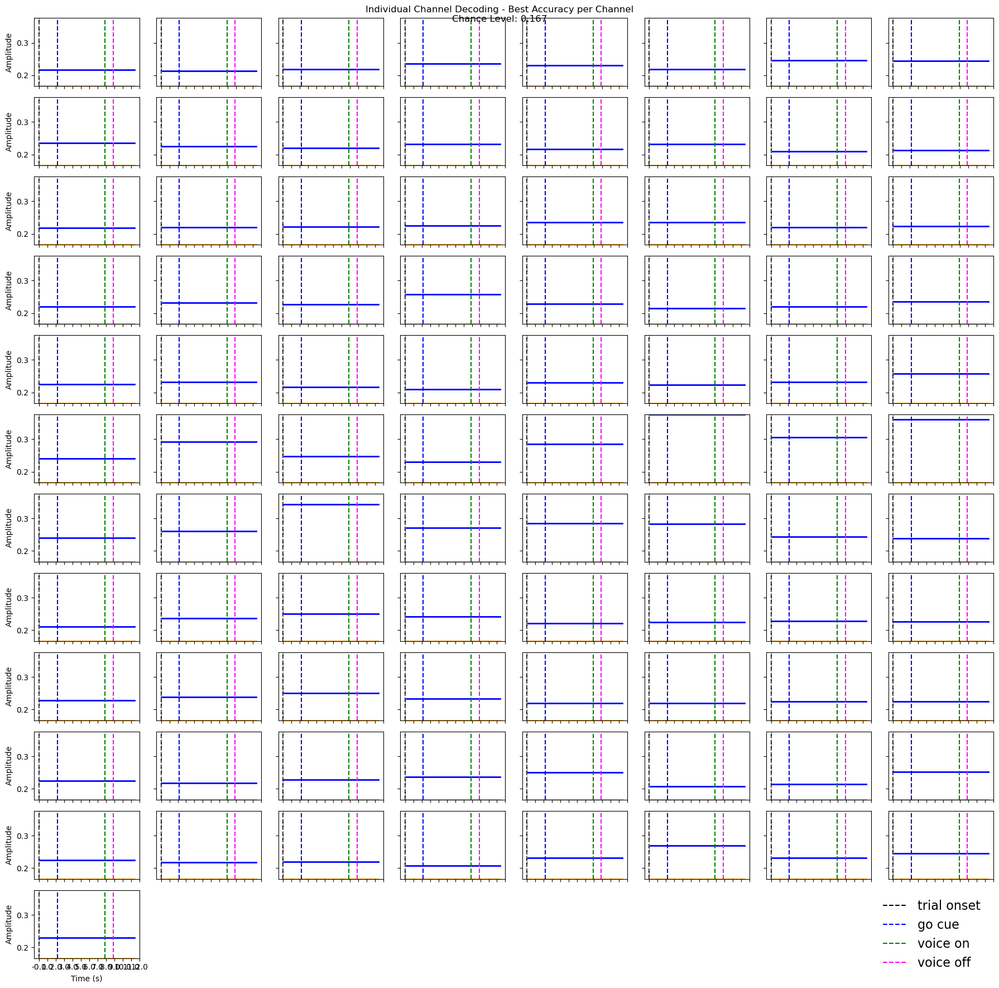


Top 10 performing channels:
 1. L2: 0.376 accuracy
 2. L10: 0.361 accuracy
 3. W12: 0.344 accuracy
 4. L5: 0.305 accuracy
 5. V9: 0.292 accuracy
 6. L1: 0.285 accuracy
 7. W14: 0.284 accuracy
 8. W15: 0.283 accuracy
 9. W13: 0.272 accuracy
10. O10: 0.269 accuracy

Channels performing >5% above chance (78/89):
  A3: 0.219
  A4: 0.235
  A12: 0.231
  B1: 0.218
  B2: 0.246
  B3: 0.244
  B4: 0.235
  B6: 0.226
  B11: 0.219
  B12: 0.231
  C1: 0.217
  C2: 0.233
  C9: 0.218
  C10: 0.220
  C11: 0.221
  D1: 0.226
  D2: 0.236
  D3: 0.235
  D11: 0.221
  D12: 0.223
  T1: 0.220
  T2: 0.232
  T3: 0.226
  T6: 0.258
  T7: 0.229
  T9: 0.220
  U2: 0.235
  U3: 0.225
  U4: 0.231
  V1: 0.229
  V2: 0.224
  V3: 0.232
  V4: 0.258
  V8: 0.240
  V9: 0.292
  V10: 0.248
  V11: 0.230
  L1: 0.285
  L2: 0.376
  L5: 0.305
  L10: 0.361
  W8: 0.240
  W9: 0.261
  W12: 0.344
  W13: 0.272
  W14: 0.284
  W15: 0.283
  J1: 0.244
  J2: 0.239
  J5: 0.237
  J6: 0.251
  J9: 0.242
  Y1: 0.222
  Y2: 0.224
  Y3: 0.228
  Y4: 0.227
  

In [117]:
# Visualize individual channel decoding accuracies
# Create a 2D array where each row represents the best accuracy for that channel across all time points
# We'll create a time series where each time point shows the channel's best accuracy
individual_channel_results = np.tile(channel_best_accuracies.reshape(-1, 1), (1, n_bins))
individual_channel_chance = 1 / len(np.unique(word_category)) * np.ones((n_clean_channels, n_bins))
# Plot the results using plot_on_channel
fig, ax = plot_on_channel(
    [individual_channel_results,
    individual_channel_chance],
    lines=[0, 
           np.nanmean(green_screen_onset),
           np.nanmean(clean_voice_onset), 
           np.nanmean(clean_voice_offset)],
    line_labels=['trial onset', 'go cue', 'voice on', 'voice off'],
    column=8,
    back=0, 
    forward=clean_data_binned.shape[2]/adjusted_fs,
    suptitle=f"Individual Channel Decoding Accuracy (Best across time)",
    #channel_colors=channel_colors,
    #title=channel_names,
    #vmin=1/len(np.unique(word_category)),  # Set minimum to chance level
    #vmax=np.max(channel_best_accuracies)   # Set maximum to best accuracy
)

# Add colorbar label
fig.suptitle(f"Individual Channel Decoding - Best Accuracy per Channel\nChance Level: {1/len(np.unique(word_category)):.3f}")
plt.show()

# Print top performing channels
top_channels_idx = np.argsort(channel_best_accuracies)[::-1][:10]
print("\nTop 10 performing channels:")
for i, ch_idx in enumerate(top_channels_idx):
    ch_name = channel_names[ch_idx] if ch_idx < len(channel_names) else f"Channel_{ch_idx}"
    print(f"{i+1:2d}. {ch_name}: {channel_best_accuracies[ch_idx]:.3f} accuracy")

# Print channels performing above chance
chance_level = 1/len(np.unique(word_category))
above_chance_mask = channel_best_accuracies > (chance_level + 0.05)  # 5% above chance
above_chance_channels = np.where(above_chance_mask)[0]
print(f"\nChannels performing >5% above chance ({len(above_chance_channels)}/{n_clean_channels}):")
for ch_idx in above_chance_channels:
    ch_name = channel_names[ch_idx] if ch_idx < len(channel_names) else f"Channel_{ch_idx}"
    print(f"  {ch_name}: {channel_best_accuracies[ch_idx]:.3f}")

In [150]:
# Alternative visualization: Time-resolved accuracy for top channels
# Get top 5 channels and show their full time course
top_5_channels = np.argsort(channel_best_accuracies)[::-1][:5]

print("Generating time-resolved decoding for top 5 channels...")
top_channel_time_courses = []

for ch_idx in tqdm(top_5_channels, desc="Top channels"):
    # Extract single channel data
    single_channel_data = clean_data_binned[:, ch_idx:ch_idx+1, :].swapaxes(1, 2)
    
    # Create fresh decoder for this channel
    single_extractor = clone(extractor) if n_components_single <= single_channel_data.shape[2] else None
    single_decoder = clone(decoder)
    
    # Create BasicClassifier for single channel
    bd_single_channel = BasicClassifier(single_extractor, single_decoder, scaler=None)
    bd_single_channel.load_data(single_channel_data, switch_2_number(word_category), n_bins_history=n_bins_single)
    
    # Fit and get time course
    bd_single_channel.fit(n_epochs=n_epochs_single)
    time_course = bd_single_channel.all_test_accuracy.mean(0)
    
    # Pad or truncate to match expected length
    if len(time_course) < n_bins:
        time_course = np.pad(time_course, (0, n_bins - len(time_course)), 'constant', constant_values=chance_level)
    else:
        time_course = time_course[:n_bins]
    
    top_channel_time_courses.append(time_course)

# Create matrix for visualization (channels x time)
top_channels_matrix = np.array(top_channel_time_courses)


Generating time-resolved decoding for top 5 channels...


Top channels: 100%|â–ˆâ–ˆâ–ˆâ–ˆâ–ˆâ–ˆâ–ˆâ–ˆâ–ˆâ–ˆ| 5/5 [00:33<00:00,  6.71s/it]


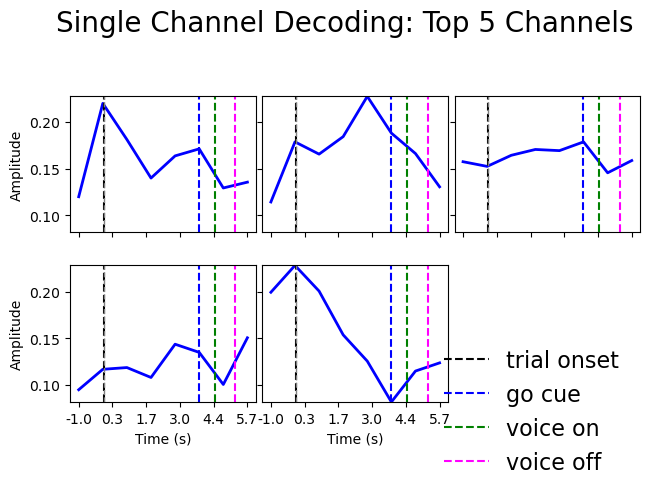

[45 44 46 47 41]

Top 5 channels decoding summary:
L2: Max accuracy = 0.220 at 0.84s
L1: Max accuracy = 0.228 at 3.35s
L5: Max accuracy = 0.179 at 4.19s
L10: Max accuracy = 0.151 at 5.86s
V9: Max accuracy = 0.228 at 0.84s


In [151]:

# Plot time-resolved accuracy for top channels
fig, ax = plot_on_channel(
    top_channels_matrix,
    lines=[0, 
           np.nanmean(green_screen_onset),
           np.nanmean(clean_voice_onset), 
           np.nanmean(clean_voice_offset)],
    line_labels=['trial onset', 'go cue', 'voice on', 'voice off'],
    column=3,
    back=np.nanmean(trial_onset), forward=clean_data_binned.shape[2]/adjusted_fs-np.nanmean(trial_onset),
    suptitle=f"Single Channel Decoding: Top 5 Channels",
    #channel_colors=[channel_colors[i] for i in top_5_channels],
    #title=[channel_names[i] for i in top_5_channels],
    #vmin=chance_level,
    #vmax=np.max(top_channels_matrix)
)
fig.set_size_inches(6, 5)
plt.show()

print(top_5_channels)
# Print summary
print(f"\nTop 5 channels decoding summary:")
for i, ch_idx in enumerate(top_5_channels):
    ch_name = channel_names[ch_idx] if ch_idx < len(channel_names) else f"Channel_{ch_idx}"
    max_acc = np.max(top_channels_matrix[i])
    peak_time = np.argmax(top_channels_matrix[i]) * (clean_data_binned.shape[2]/adjusted_fs) / n_bins
    print(f"{ch_name}: Max accuracy = {max_acc:.3f} at {peak_time:.2f}s")